In [12]:
#
import pandas as pd
import numpy as np
#from plotnine import *
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import accuracy_score
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.metrics import precision_score, recall_score
from sklearn.metrics import cohen_kappa_score
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PolynomialFeatures
from sklearn.model_selection import train_test_split
from sklearn.svm import LinearSVC
from sklearn.svm import SVC

from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_graphviz
from sklearn.ensemble import BaggingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import make_scorer
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.metrics import log_loss
from sklearn.pipeline import Pipeline
from sklearn.ensemble import VotingClassifier 
from sklearn.ensemble import BaggingClassifier 

from scipy.interpolate import interp1d
from scipy import interpolate
    
import statsmodels.api as sm
import itertools

from scipy.stats import mode

import random
 
import matplotlib.pyplot as plt
plt.style.use('classic')
%matplotlib inline
import seaborn as sns
sns.set()

import xgboost as xgb

import ipywidgets
from scipy.signal import butter, lfilter #Import the extra module required
from statsmodels import robust

import pywt

In [2]:
train = pd.read_csv('C:\\Users\\i053131\\Desktop\\Epilepsie\\CFM\\data\\raw\\training_input.csv', sep=';')
test = pd.read_csv('C:\\Users\\i053131\\Desktop\\Epilepsie\\CFM\\data\\raw\\testing_input.csv', sep=';') 
output = pd.read_csv('C:\\Users\\i053131\\Desktop\\Epilepsie\\CFM\\data\\raw\\challenge_output_data_training_file_volatility_prediction_in_financial_markets.csv', sep=';')

In [3]:
y = output["TARGET"]

In [154]:
def MAPE(y_true, y_pred):
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100
def MAPE_residus(y_true, y_pred):
    return np.abs((y_true - y_pred) / y_true)

In [4]:
print("train.shape", train.shape)
print("test.shape", test.shape)
print("y.shape", y.shape)

train.shape (636313, 111)
test.shape (635397, 111)
y.shape (636313,)


Text(0,0.5,'Frequency')

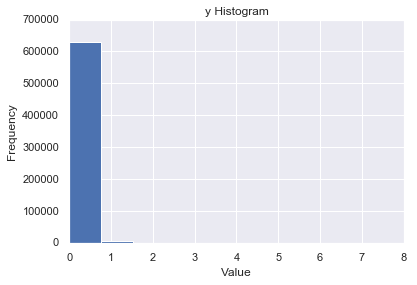

In [5]:
plt.hist(y)
plt.title("y Histogram")
plt.xlabel("Value")
plt.ylabel("Frequency")

Text(0,0.5,'Frequency')

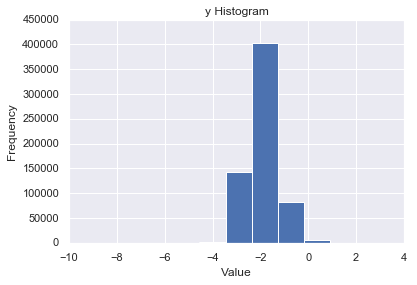

In [6]:


plt.hist(np.log(y))
plt.title("y Histogram")
plt.xlabel("Value")
plt.ylabel("Frequency")

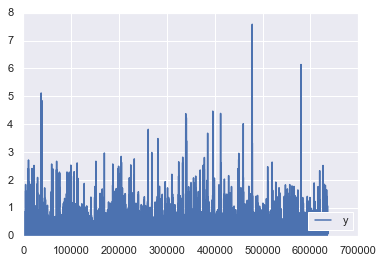

In [7]:
plt.plot(y, label = "y")
plt.legend(loc='lower right')
plt.show()

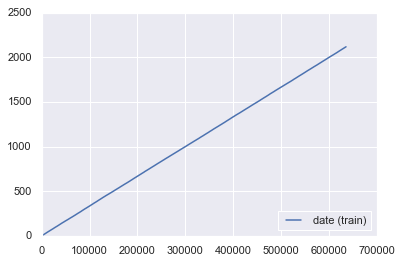

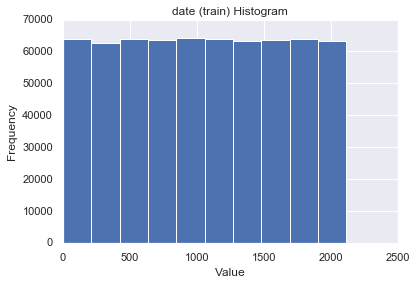

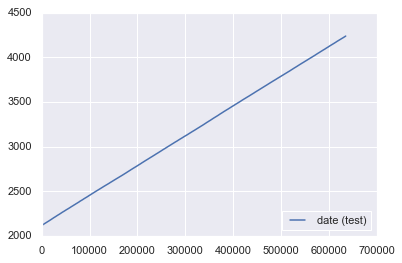

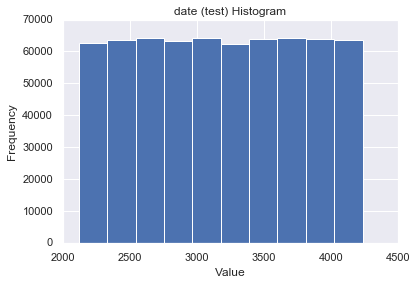

In [8]:
plt.plot(train.date, label = "date (train)")
plt.legend(loc='lower right')
plt.show()


plt.hist(train.date)
plt.title("date (train) Histogram")
plt.xlabel("Value")
plt.ylabel("Frequency")
plt.show()

plt.plot(test.date, label = "date (test)")
plt.legend(loc='lower right')
plt.show()

plt.hist(test.date)
plt.title("date (test) Histogram")
plt.xlabel("Value")
plt.ylabel("Frequency")
plt.show()


In [9]:
train.date.unique()

array([   1,    2,    3, ..., 2115, 2116, 2117], dtype=int64)

In [10]:
test.date.unique()

array([2118, 2119, 2120, ..., 4235, 4236, 4237], dtype=int64)

In [11]:
ydf=pd.concat([train.iloc[:, 1:3], output.iloc[:, 1:]], axis=1)

In [12]:
ydf.head()

,date,product_id,TARGET
0,1,1,0.134168
1,1,2,0.046126
2,1,3,0.144312
3,1,4,0.130176
4,1,5,0.085873


2217 different dates
318 different products

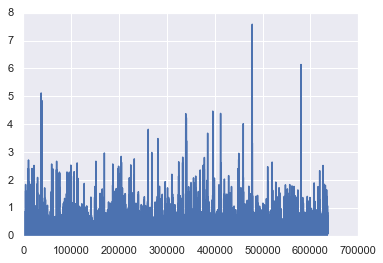

In [13]:
plt.plot(ydf.TARGET, label = "y volatitlity")
#plt.legend(loc='lower right')
plt.show()


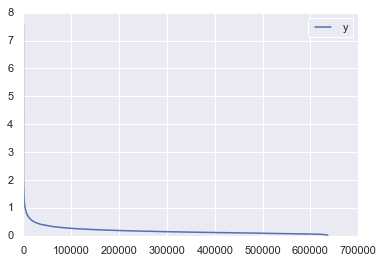

In [14]:
l = ydf.TARGET.sort_values(ascending=False)
plt.plot(range(0, ydf.shape[0]), l, label = "y")
plt.legend(loc='upper right')
plt.show()

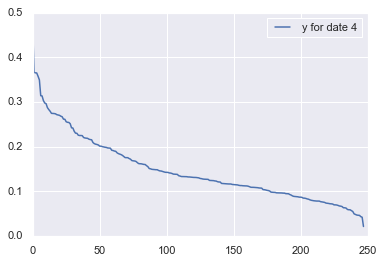

In [15]:
l = ydf[ydf.date==4].TARGET.sort_values(ascending=False)
plt.plot(range(0, ydf[ydf.date==4].shape[0]), l, label = "y for date 4")
plt.legend(loc='upper right')
plt.show()

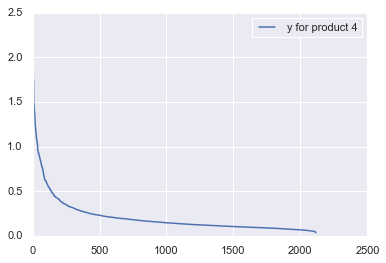

In [16]:
l = ydf[ydf.product_id==4].TARGET.sort_values(ascending=False)
plt.plot(range(0, ydf[ydf.product_id==4].shape[0]), l, label = "y for product 4")
plt.legend(loc='upper right')
plt.show()

In [17]:
ydf.TARGET.describe()

count    636313.000000
mean          0.183569
std           0.155562
min           0.000132
25%           0.098403
50%           0.141679
75%           0.214632
max           7.581517
Name: TARGET, dtype: float64

In [18]:
ydf.date.unique()

array([   1,    2,    3, ..., 2115, 2116, 2117], dtype=int64)

In [19]:
ydf.product_id.unique()

array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104,
       105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117,
       118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130,
       131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143,
       144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156,
       157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169,
       170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 18

In [20]:
train.head()

,ID,date,product_id,volatility 09:30:00,volatility 09:35:00,volatility 09:40:00,volatility 09:45:00,volatility 09:50:00,volatility 09:55:00,volatility 10:00:00,...,return 13:10:00,return 13:15:00,return 13:20:00,return 13:25:00,return 13:30:00,return 13:35:00,return 13:40:00,return 13:45:00,return 13:50:00,return 13:55:00
0,1,1,1,0.662737,0.716896,0.698601,0.480172,0.623665,0.201876,0.327206,...,1.0,1.0,1.0,-1.0,1.0,-1.0,0.0,1.0,1.0,-1.0
1,2,1,2,0.285394,0.379560,0.094858,0.094794,0.055315,0.173994,0.102745,...,1.0,1.0,1.0,1.0,1.0,-1.0,-1.0,1.0,-1.0,-1.0
2,3,1,3,1.151646,1.093562,1.833443,0.595823,0.310177,0.792310,0.401979,...,1.0,1.0,-1.0,-1.0,1.0,1.0,-1.0,1.0,1.0,1.0
3,4,1,4,0.835260,0.329615,0.340366,0.216692,0.350371,0.247594,0.341194,...,-1.0,1.0,1.0,0.0,1.0,-1.0,-1.0,-1.0,-1.0,1.0
4,5,1,5,0.274185,0.061076,0.010168,0.060890,0.000000,0.213162,0.162763,...,-1.0,1.0,1.0,0.0,1.0,0.0,-1.0,-1.0,-1.0,0.0


In [7]:
return_ = train.iloc[:, 57:]
returnTest = test.iloc[:, 57:]

In [22]:
return_.head()

,return 09:30:00,return 09:35:00,return 09:40:00,return 09:45:00,return 09:50:00,return 09:55:00,return 10:00:00,return 10:05:00,return 10:10:00,return 10:15:00,...,return 13:10:00,return 13:15:00,return 13:20:00,return 13:25:00,return 13:30:00,return 13:35:00,return 13:40:00,return 13:45:00,return 13:50:00,return 13:55:00
0,-1.0,-1.0,-1.0,-1.0,1.0,-1.0,1.0,1.0,-1.0,-1.0,...,1.0,1.0,1.0,-1.0,1.0,-1.0,0.0,1.0,1.0,-1.0
1,1.0,1.0,1.0,0.0,-1.0,-1.0,1.0,-1.0,1.0,1.0,...,1.0,1.0,1.0,1.0,1.0,-1.0,-1.0,1.0,-1.0,-1.0
2,-1.0,-1.0,1.0,1.0,1.0,-1.0,1.0,1.0,1.0,-1.0,...,1.0,1.0,-1.0,-1.0,1.0,1.0,-1.0,1.0,1.0,1.0
3,-1.0,1.0,-1.0,-1.0,1.0,-1.0,-1.0,1.0,1.0,-1.0,...,-1.0,1.0,1.0,0.0,1.0,-1.0,-1.0,-1.0,-1.0,1.0
4,1.0,-1.0,0.0,1.0,0.0,-1.0,-1.0,-1.0,1.0,1.0,...,-1.0,1.0,1.0,0.0,1.0,0.0,-1.0,-1.0,-1.0,0.0


In [9]:
volatility = train.iloc[:,3:57]
volatilityTest=test.iloc[:,3:57]
volatility.head()

,volatility 09:30:00,volatility 09:35:00,volatility 09:40:00,volatility 09:45:00,volatility 09:50:00,volatility 09:55:00,volatility 10:00:00,volatility 10:05:00,volatility 10:10:00,volatility 10:15:00,...,volatility 13:10:00,volatility 13:15:00,volatility 13:20:00,volatility 13:25:00,volatility 13:30:00,volatility 13:35:00,volatility 13:40:00,volatility 13:45:00,volatility 13:50:00,volatility 13:55:00
0,0.662737,0.716896,0.698601,0.480172,0.623665,0.201876,0.327206,0.374239,0.207611,0.213038,...,0.115572,0.230885,0.062962,0.274345,0.393201,0.078658,0.041951,0.115287,0.136218,0.052386
1,0.285394,0.379560,0.094858,0.094794,0.055315,0.173994,0.102745,0.079102,0.047445,0.071119,...,0.031630,0.079048,0.071119,0.078995,0.220849,0.142118,0.039484,0.055287,0.059276,0.071155
2,1.151646,1.093562,1.833443,0.595823,0.310177,0.792310,0.401979,0.336490,0.619155,0.504735,...,0.118179,0.275287,0.249349,0.262916,0.341119,0.170464,0.275906,0.196799,0.111488,0.117980
3,0.835260,0.329615,0.340366,0.216692,0.350371,0.247594,0.341194,0.175573,0.278420,0.113430,...,0.041458,0.217509,0.103530,0.031052,0.217124,0.186312,0.051811,0.093239,0.082934,0.155294
4,0.274185,0.061076,0.010168,0.060890,0.000000,0.213162,0.162763,0.203675,0.456380,0.303923,...,0.071567,0.275442,0.081595,0.020390,0.162940,0.040744,0.122338,0.050963,0.112193,0.000000


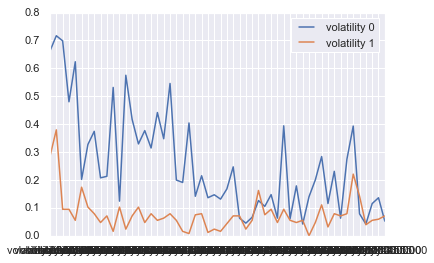

In [24]:
for i in range(0, 2):
    plt.plot(volatility.iloc[i, :], label = "volatility " + str(i))
    plt.legend(loc='upper right')
plt.show()

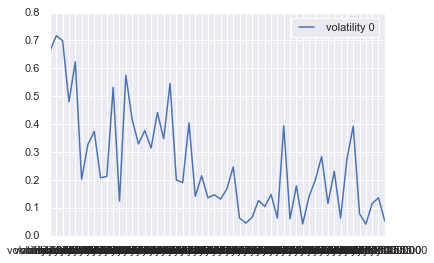

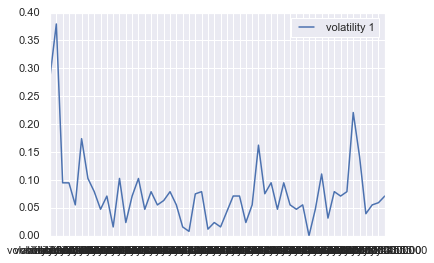

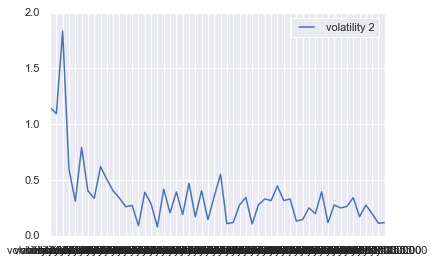

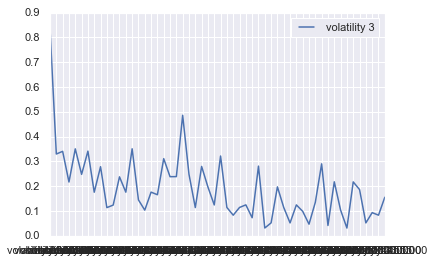

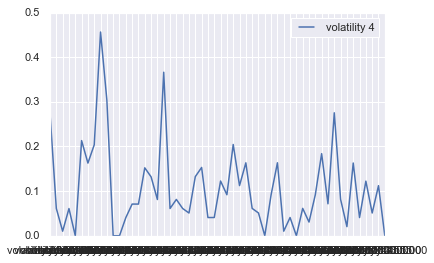

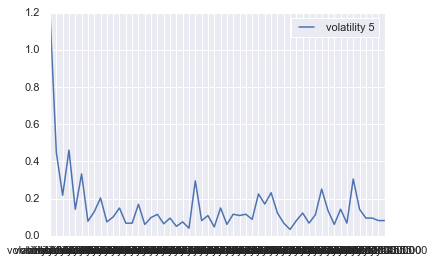

In [25]:
for i in range(0, 6):
    plt.plot(volatility.iloc[i, :], label = "volatility " + str(i))
    plt.legend(loc='upper right')
    plt.show()

In [26]:
volatility.shape

(636313, 54)

In [27]:
def get_peak(s, viz=False): #s is a serie
    #Calculate moving average with 0.75s in both directions, then append do dataset
    hrw = 0.75 #One-sided window size, as proportion of the sampling frequency
    fs = 6 #one measure every 5 minutes | 12 per hour
    mov_avg = s.rolling(int(hrw*fs)).mean() #Calculate moving average
    #print(mov_avg)

    avg_hr = np.mean(s)
    mov_avg[np.isnan(mov_avg)] = avg_hr

    mov_avg = mov_avg *0.8  #For now we raise the average by 20% to prevent the secondary heart contraction from interfering, 
    pulse_rollingmean = mov_avg 

    #Mark regions of interest
    window = []
    peaklist = []
    listpos = 0 #We use a counter to move over the different data columns
    for datapoint in s:
        rollingmean = pulse_rollingmean[listpos] #Get local mean
        if (datapoint <= rollingmean) and (len(window) <= 1): #If no detectable R-complex activity -> do nothing
            listpos += 1
        elif (datapoint > rollingmean): #If signal comes above local mean, mark ROI
            window.append(datapoint)
            listpos += 1
        else: #If signal drops below local mean -> determine highest point
            maximum = np.max(window)
            beatposition = listpos - len(window) + (window.index(np.max(window))) #Notate the position of the point on the X-axis
            peaklist.append(beatposition) #Add detected peak to list
            window = [] #Clear marked ROI
            listpos += 1
    #print(peaklist)
    
    ybeat = [s[x] for x in peaklist] #Get the y-value of all peaks for plotting purposes
    if (viz):
        fig = plt.figure(figsize=(14, 8))
        ax1 = fig.add_subplot(211)
        ax1.set_title("Detected peaks in signal")
        #ax1.set_xlim(0,1500)
        ax1.plot(s, alpha=0.5, color='blue') #Plot semi-transparent HR
        ax1.plot(mov_avg, color ='green') #Plot moving average
        ax1.scatter(peaklist, ybeat, color='red') #Plot detected peaks
        fig.show()
    return peaklist

C:\Anaconda3\lib\site-packages\matplotlib\figure.py:459: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


[1, 5, 11, 14, 19, 24, 29, 33, 39, 43, 48]

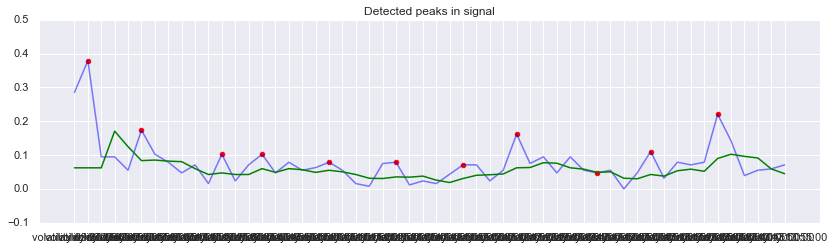

In [28]:
get_peak(volatility.loc[1, :], viz=True)

## Spectral investigation on volatitlity 

#### Step 1: we investigate difference vs the global tend, so we look at vol - avg(vol)

In [10]:
scaledVol = (volatility - volatility.mean(axis=0))/(volatility.std(axis=0))

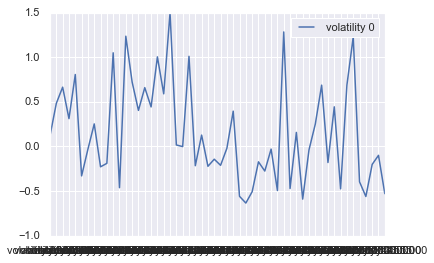

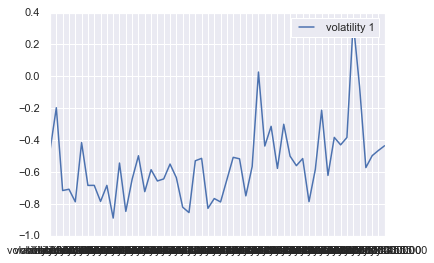

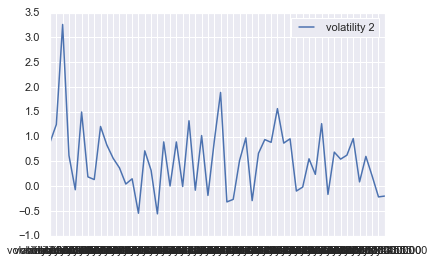

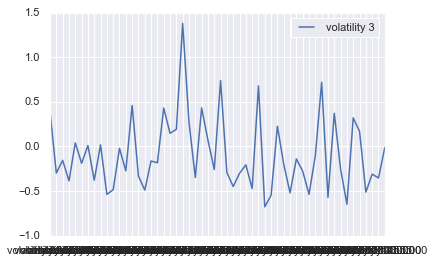

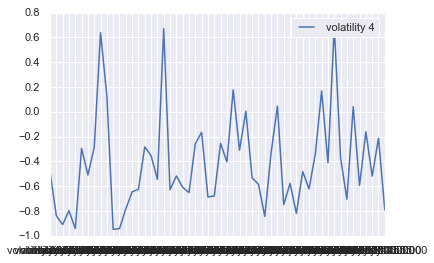

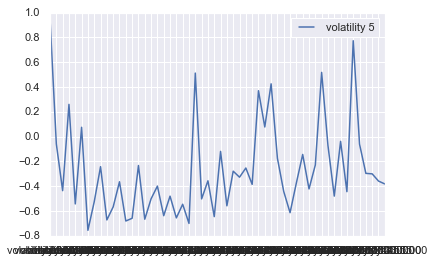

In [17]:
for i in range(0, 6):
    plt.plot(scaledVol.iloc[i, :], label = "volatility " + str(i))
    plt.legend(loc='upper right')
    plt.show()

In [18]:
N = volatility.size; print(N)

34360902


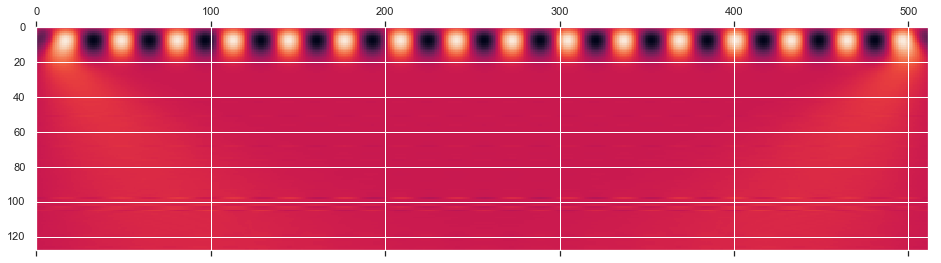

In [21]:
import numpy as np
import matplotlib.pyplot as plt
x = np.arange(512)
y = np.sin(2*np.pi*x/32)
coef, freqs=pywt.cwt(y,np.arange(1,129),'gaus1')
plt.matshow(coef) 
plt.show() 

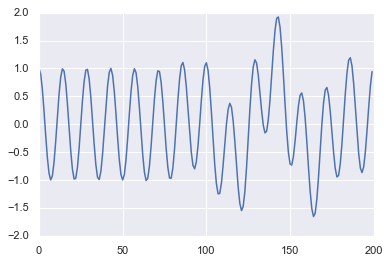

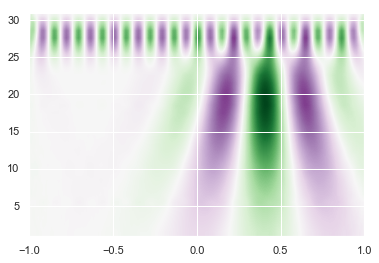

In [29]:
t = np.linspace(-1, 1, 200, endpoint=False)
sig  = np.cos(2 * np.pi * 7 * t) + np.real(np.exp(-7*(t-0.4)**2)*np.exp(1j*2*np.pi*2*(t-0.4)))
plt.plot(sig)
plt.show()
widths = np.arange(1, 31)
cwtmatr, freqs = pywt.cwt(sig, widths, 'mexh')

plt.imshow(cwtmatr, extent=[-1, 1, 1, 31], cmap='PRGn', aspect='auto',vmax=abs(cwtmatr).max(), vmin=-abs(cwtmatr).max())  
plt.show() 

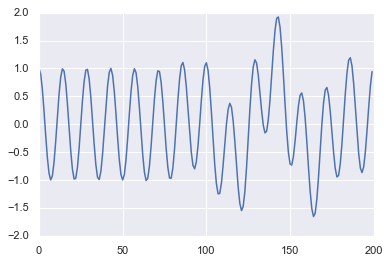

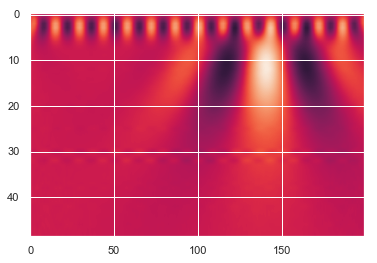

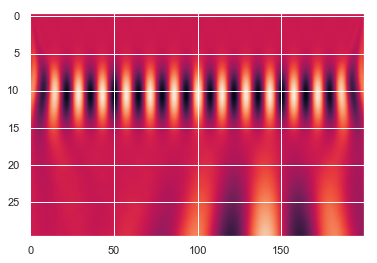

In [47]:
t = np.linspace(-1, 1, 200, endpoint=False)
sig  = np.cos(2 * np.pi * 7 * t) + np.real(np.exp(-7*(t-0.4)**2)*np.exp(1j*2*np.pi*2*(t-0.4)))
plt.plot(sig)
plt.show()

widths = np.arange(1, 50)
cwtmatr, freqs = pywt.cwt(sig, widths, 'mexh')

plt.imshow(cwtmatr, aspect='auto',vmax=abs(cwtmatr).max(), vmin=-abs(cwtmatr).max())  
plt.show() 

widths = np.arange(1, 31)
cwtmatr, freqs = pywt.cwt(sig, widths, 'morl')

plt.imshow(cwtmatr, aspect='auto',vmax=abs(cwtmatr).max(), vmin=-abs(cwtmatr).max())  
plt.show() 



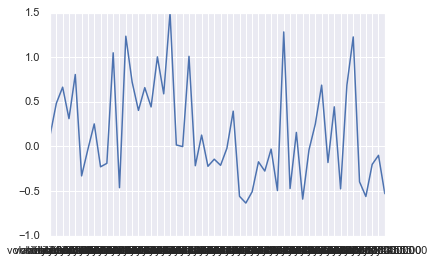

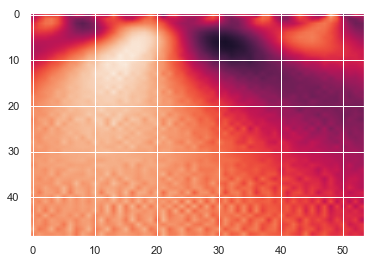

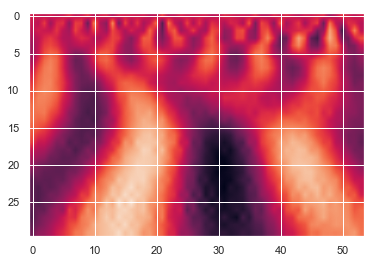

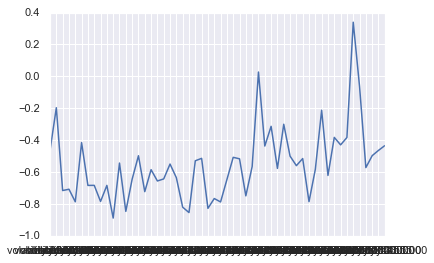

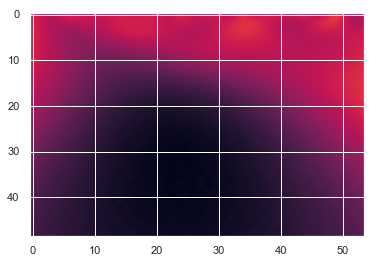

...

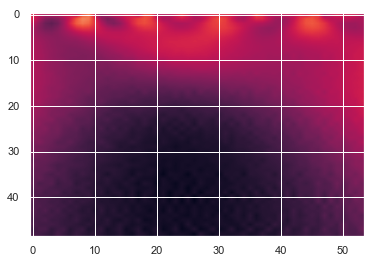

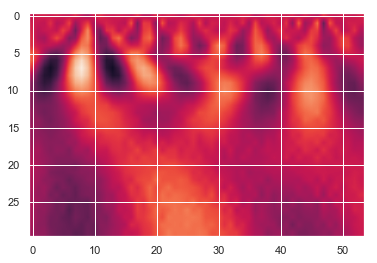

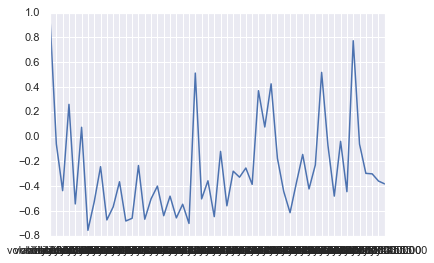

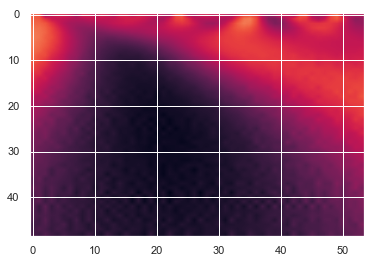

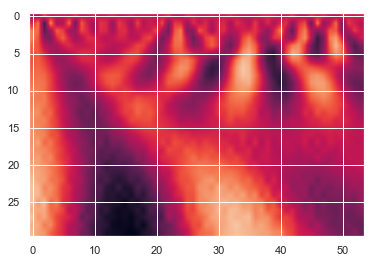

In [13]:
for i in range(0, 6):
    sig = scaledVol.iloc[i, :]

    plt.plot(sig)
    plt.show()

    widths = np.arange(1, 50)
    cwtmatr, freqs = pywt.cwt(sig, widths, 'mexh')

    plt.imshow(cwtmatr, aspect='auto',vmax=abs(cwtmatr).max(), vmin=-abs(cwtmatr).max())  
    plt.show() 

    widths = np.arange(1, 31)
    cwtmatr, freqs = pywt.cwt(sig, widths, 'morl')

    plt.imshow(cwtmatr, aspect='auto',vmax=abs(cwtmatr).max(), vmin=-abs(cwtmatr).max())  
    plt.show() 

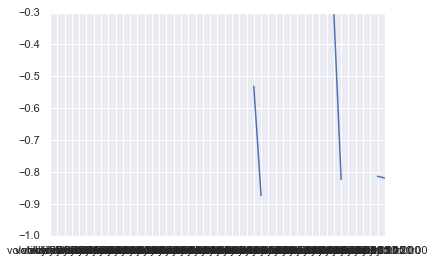

C:\Anaconda3\lib\site-packages\numpy\core\_methods.py:28: RuntimeWarning: invalid value encountered in reduce
  return umr_maximum(a, axis, None, out, keepdims, initial)


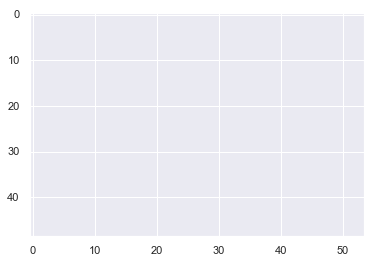

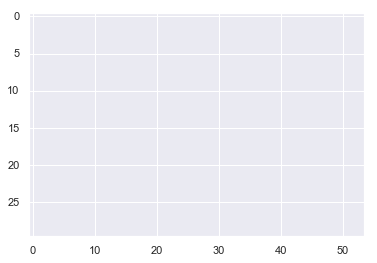

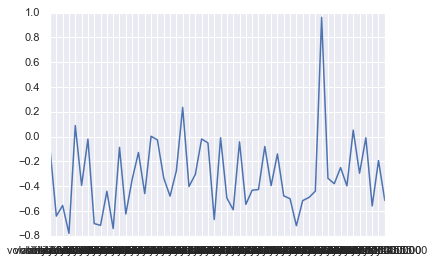

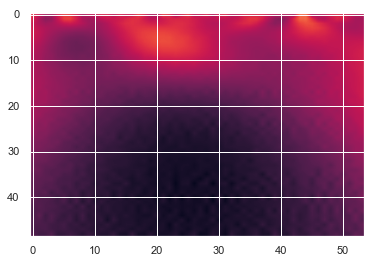

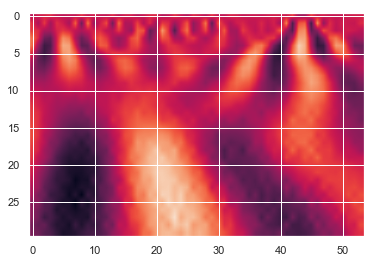

In [15]:
for i in range(210, 212):
    sig = scaledVol.iloc[i, :]

    plt.plot(sig)
    plt.show()

    widths = np.arange(1, 50)
    cwtmatr, freqs = pywt.cwt(sig, widths, 'mexh')

    plt.imshow(cwtmatr, aspect='auto',vmax=abs(cwtmatr).max(), vmin=-abs(cwtmatr).max())  
    plt.show() 

    widths = np.arange(1, 31)
    cwtmatr, freqs = pywt.cwt(sig, widths, 'morl')

    plt.imshow(cwtmatr, aspect='auto',vmax=abs(cwtmatr).max(), vmin=-abs(cwtmatr).max())  
    plt.show() 

In [28]:
scaledVol.shape
volatility.shape

(636313, 54)

In [29]:
pad = pd.DataFrame(np.zeros(636313* 5).reshape((636313, 5)))
scaleVolPad = pd.concat([pad, scaledVol, pad], axis = 1)
scaleVolPad.shape

volPad = pd.concat([pad, volatility, pad], axis = 1)
volPad.shape

(636313, 64)

In [133]:
sig = scaledVol.iloc[0, :]
t = pywt.swt(scaleVolPad.iloc[0, :], wavelet='db2', level=3, start_level=0, axis=-1)
p = pywt.wavedec(sig, wavelet='db2', mode='zero', level=2, axis=-1)
r = pywt.wavedec(sig, wavelet='db2', mode='zero', axis=-1)

In [134]:
for i in range(0, len(p)):
    print(len(p[i]), p[i])


15 [-0.08184678  0.63189568  0.48544132  0.01667256  1.18729843  1.48713484
  1.06140927 -0.03503003 -0.05506431 -0.99295746  0.37841913 -0.27634922
  0.49367558  0.43529262 -0.59962112]
15 [-0.30545635  0.51401611  0.00850904 -0.35589032 -0.1897777   0.84813229
  0.10914975 -0.40467136 -0.55314849 -0.49004587 -0.1211806   0.56459975
  0.38669103 -0.21468077  0.16066799]
28 [-0.13137219  0.28102431  0.67754836 -0.17820206 -0.15204459  1.17241626
  0.65228877 -0.30191642 -0.31415218 -0.51229022 -0.39738567  0.94699336
  0.13144768  0.01592414 -0.14246449 -0.24684216 -0.1265675  -0.11196266
 -0.98993617 -0.69378982 -0.44971535 -0.036187   -0.55141494 -0.80526795
  1.12495475 -0.44168964  0.28973442  0.1313631 ]


In [136]:
for i in range(0, len(r)):
    print(len(r[i]), r[i])

6 [-0.09953197  0.25559341  2.10836487 -0.3859427   0.32956516 -0.13986353]
6 [-0.37145836 -0.84599294  0.35385012 -0.13361846 -0.34795028  0.03747632]
9 [-0.37364834  0.26698356  0.20840574  0.41782449  0.30399474  0.67971136
  0.21570843 -0.66304733  0.07759668]
15 [-0.30545635  0.51401611  0.00850904 -0.35589032 -0.1897777   0.84813229
  0.10914975 -0.40467136 -0.55314849 -0.49004587 -0.1211806   0.56459975
  0.38669103 -0.21468077  0.16066799]
28 [-0.13137219  0.28102431  0.67754836 -0.17820206 -0.15204459  1.17241626
  0.65228877 -0.30191642 -0.31415218 -0.51229022 -0.39738567  0.94699336
  0.13144768  0.01592414 -0.14246449 -0.24684216 -0.1265675  -0.11196266
 -0.98993617 -0.69378982 -0.44971535 -0.036187   -0.55141494 -0.80526795
  1.12495475 -0.44168964  0.28973442  0.1313631 ]


In [144]:
r[0]

array([-0.09953197,  0.25559341,  2.10836487, -0.3859427 ,  0.32956516,
       -0.13986353])

In [150]:
a = pywt.wavedec(scaledVol, wavelet='db2', mode='zero', axis=-1)
len(a)

5

In [291]:
b = pywt.wavedec(scaledVol, wavelet='db1', mode='zero', axis=-1)
len(b)
b[0]

array([[ 1.51119241, -0.04876459],
       [-3.68943446, -1.56250914],
       [ 3.24692285,  1.87932666],
       ...,
       [-0.13525548, -1.37672358],
       [        nan,         nan],
       [-3.34120531, -1.87339197]])

In [293]:
c = pywt.wavedec(scaledVol, wavelet='coif2', mode='zero', axis=-1)
len(c)

3

In [217]:
ca4 = pd.DataFrame(a[0], columns = range(0, a[0].shape[1]))
cd4 = pd.DataFrame(a[1], columns = range(a[0].shape[1], a[0].shape[1]+ a[1].shape[1]))
cd3 = pd.DataFrame(a[2], columns = range(a[0].shape[1]+ a[1].shape[1], a[0].shape[1]+a[1].shape[1]+a[2].shape[1]))
cd2 = pd.DataFrame(a[3], columns = range(a[0].shape[1]+a[1].shape[1]+a[2].shape[1], 
                                         a[0].shape[1]+a[1].shape[1]+a[2].shape[1]+a[3].shape[1]))
cd1 = pd.DataFrame(a[4], columns = range(a[0].shape[1]+a[1].shape[1]+a[2].shape[1]+a[3].shape[1], 
                                         a[0].shape[1]+a[1].shape[1]+a[2].shape[1]+a[3].shape[1]+a[4].shape[1]))



In [256]:
cd4.shape
list(cd1.iloc[:,0])

[-0.13137218652545146,
 -0.29383484975875873,
 0.13794182058500704,
 0.47014633366758973,
 0.0016720367497855548,
 0.8255564021611012,
 -0.2186207366446032,
 -0.06342546529993415,
 -0.6515670887289513,
 -0.31249027298339627,
 0.226755672747744,
 0.2576232483711095,
 0.7760054552849514,
 0.5695852267440715,
 -0.19008928044078796,
 -0.16159933692245596,
 -0.08570469038232559,
 0.582260353901553,
 0.11213711502943285,
 -0.010647562858303872,
 -0.12785906029556504,
 0.3936744791202561,
 -0.7310501445725698,
 -0.06058452904915712,
 0.2712380139439103,
 -0.14766975381681896,
 -0.6348017871285018,
 0.5614714925960742,
 0.203096989463836,
 -0.47868975947026615,
 -0.23794350432516687,
 -0.46085068404183965,
 -0.1489935818676732,
 -0.37281095038321277,
 -0.3024735903283763,
 0.7260926374488559,
 0.34090869164516163,
 -0.13971005014293564,
 0.8509767502646962,
 0.2459671172121981,
 0.2768878523964609,
 -0.45563150220755105,
 -0.2299680886496249,
 0.14145320929460006,
 -0.32161676319465393,
 0.276

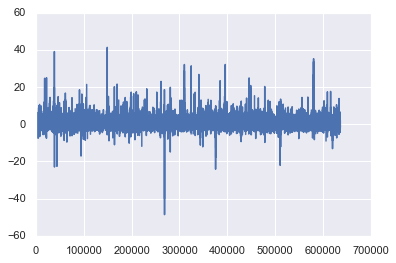

In [265]:
#for i in range(0, cd1.shape[1]):
i=0
plt.plot(cd4.iloc[:,1])
#plt.title("cd1 coef " + str(i))
#plt.xlabel("Inflexion per hours")
#plt.ylabel("Frequency")
#plt.yscale('log', nonposy='clip')
plt.show()

looking for variance for each potential features
- for each level, remove firsst an last coefficent
- ca4 by far the most relevant
- then goes decreasing

In [277]:
c = 1
for d in [ca4, cd4, cd3, cd2, cd1]:
    print(d.std())
    print('------------')
        

0    0.169134
1    0.948761
2    2.734788
3    2.694933
4    2.803151
5    0.335631
dtype: float64
------------
6     0.631218
7     1.009156
8     0.922439
9     0.919598
10    0.426752
11    0.089932
dtype: float64
------------
12    0.660930
13    0.828012
14    0.816508
15    0.824045
16    0.828977
17    0.828419
18    0.801848
19    0.894631
20    0.186209
dtype: float64
------------
21    0.558561
22    0.745243
23    0.742773
24    0.757183
25    0.761874
26    0.762493
27    0.771333
28    0.763735
29    0.766262
30    0.763708
31    0.764243
32    0.755063
33    0.750347
34    0.725872
35    0.385555
dtype: float64
------------
36    0.747059
37    0.698396
38    0.719199
39    0.734076
40    0.730045
41    0.728133
42    0.731196
43    0.723782
44    0.736321
45    0.729514
46    0.731983
47    0.739878
48    0.732111
49    0.734276
50    0.738907
51    0.732916
52    0.738375
53    0.731019
54    0.728604
55    0.723463
56    0.727044
57    0.723823
58    0.722621
59    0.7

#### Energy variance

In [287]:
c = 1
for d in [ca4, cd4, cd3, cd2, cd1]:
    tmp1 = d**2
    tmp2 = tmp1.sum(axis=1)
    print(tmp2.std())
    print('------------')

167.7050907570115
------------
24.014739485513054
------------
34.949423170663394
------------
37.097640822048355
------------
53.80827882408904
------------


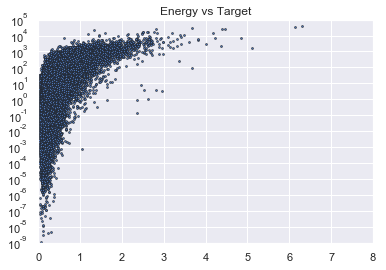

--------------


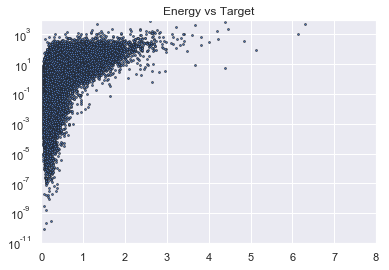

--------------


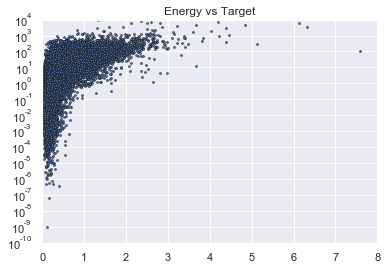

--------------


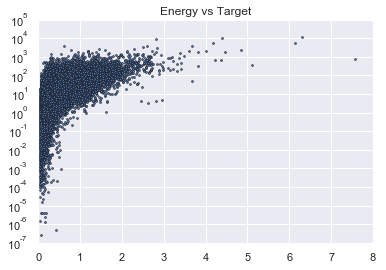

--------------


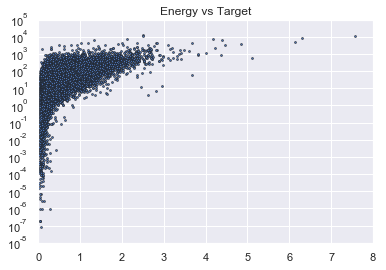

--------------


In [289]:
for d in [ca4, cd4, cd3, cd2, cd1]:
    tmp1 = d**2
    tmp2 = tmp1.sum(axis=1)
    tmp = pd.DataFrame({'Energy': tmp2, 'TARGET': output["TARGET"] })
    ax = plt.subplot()
#    ax.set_xscale("log", nonposx='clip')
    ax.set_yscale("log", nonposy='clip')
    plt.plot( 'TARGET', 'Energy', data=tmp, linestyle='', marker='o', markersize=2)
    #ax.set_ylim(ymin=0.1)
    ax.set_title('Energy vs Target')
    plt.show()
    print('--------------')

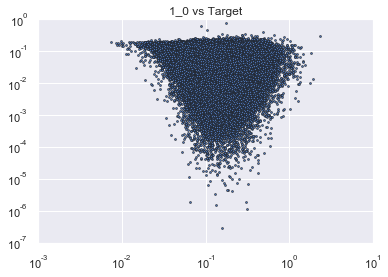

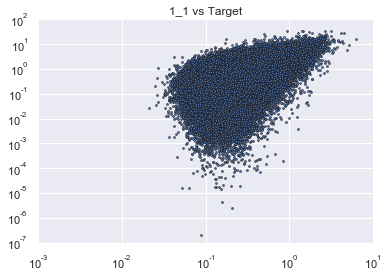

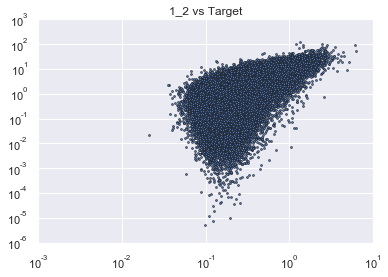

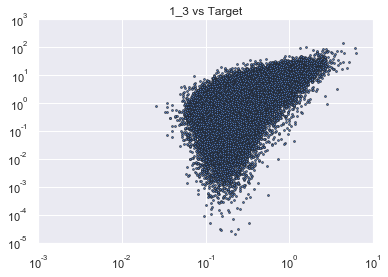

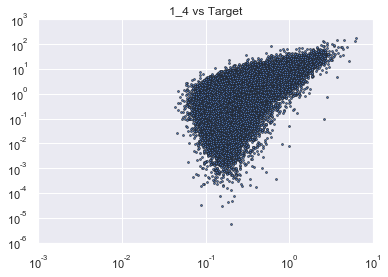

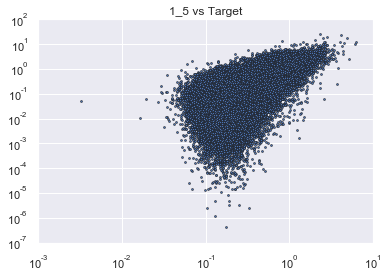

------------------


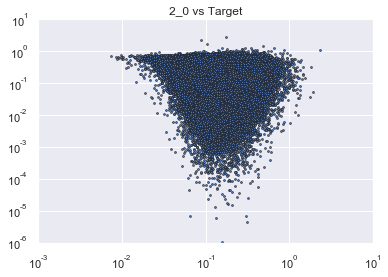

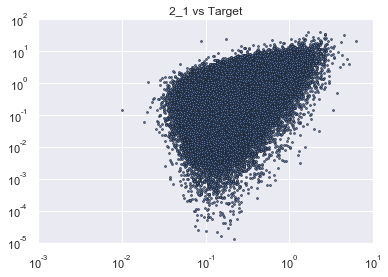

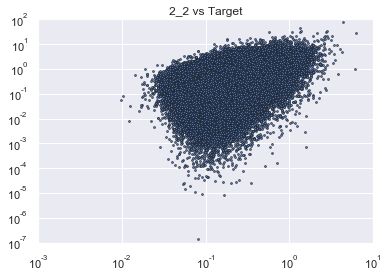

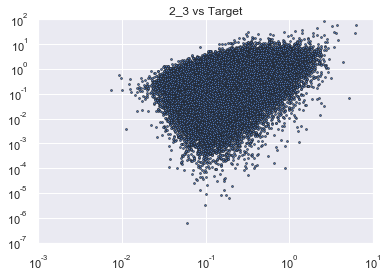

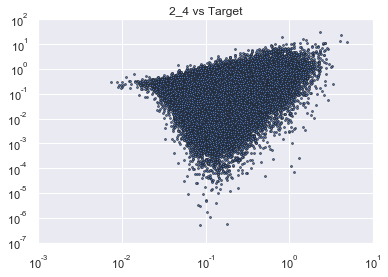

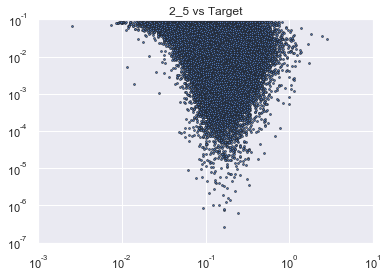

------------------


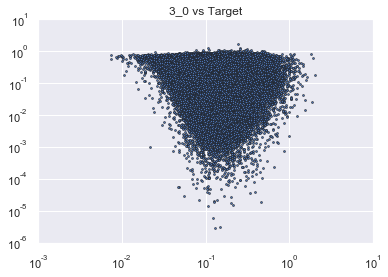

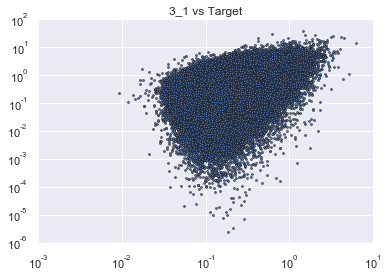

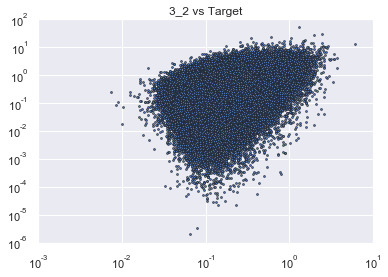

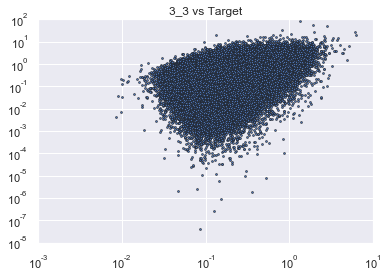

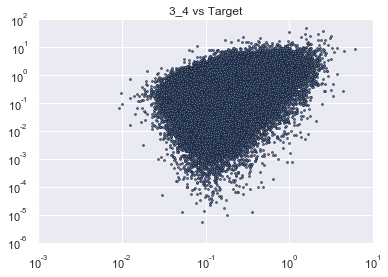

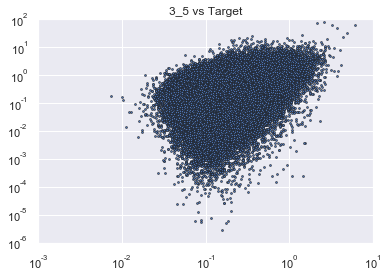

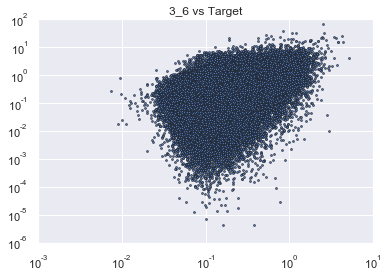

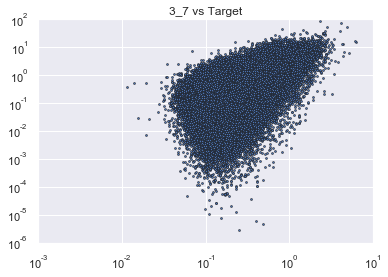

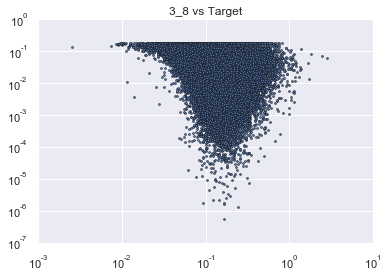

------------------


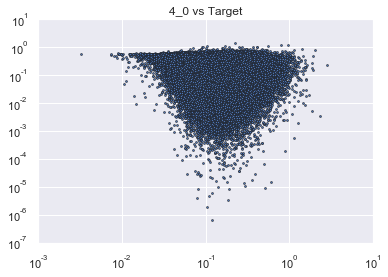

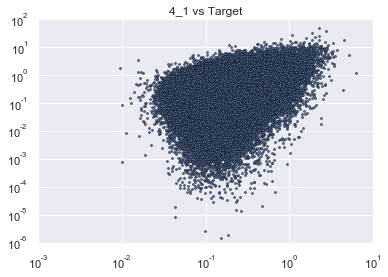

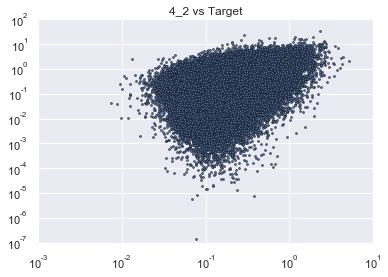

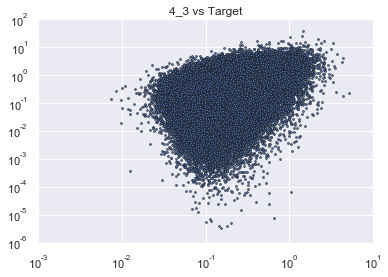

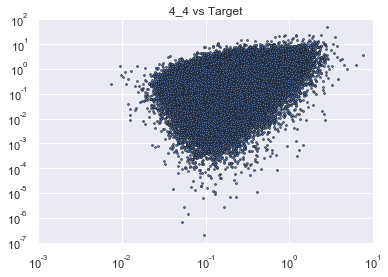

...

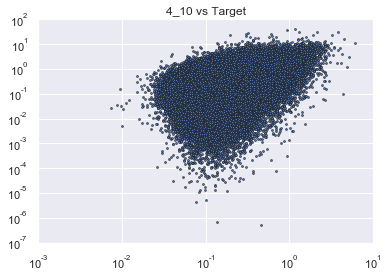

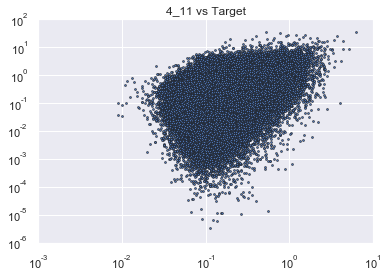

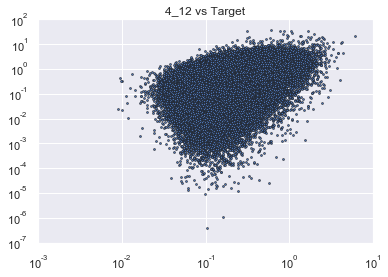

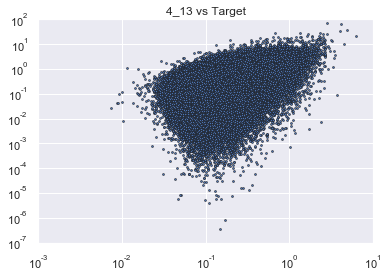

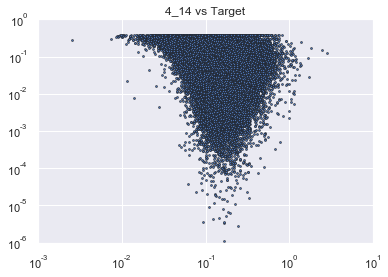

------------------


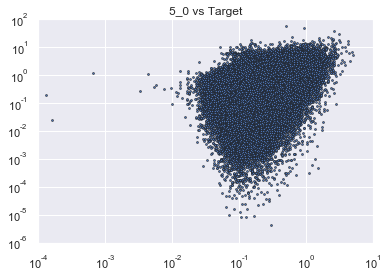

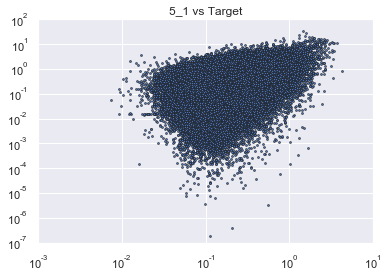

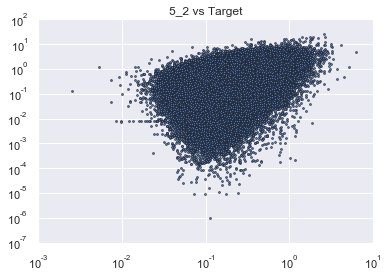

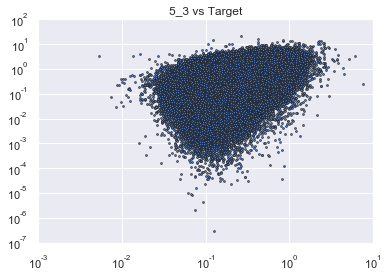

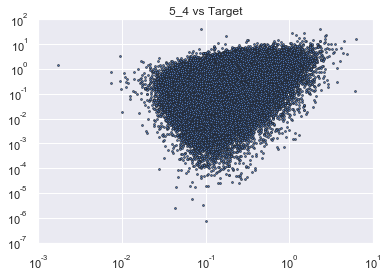

...

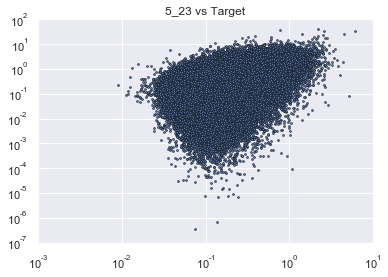

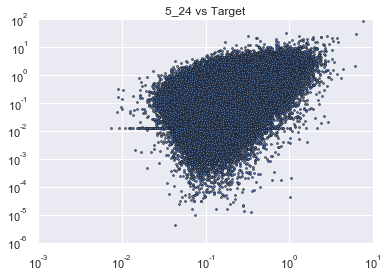

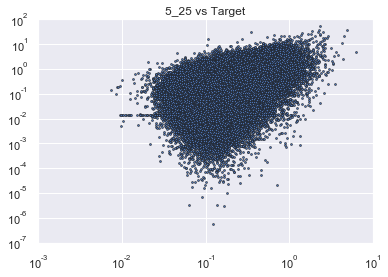

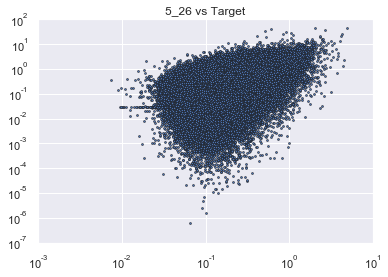

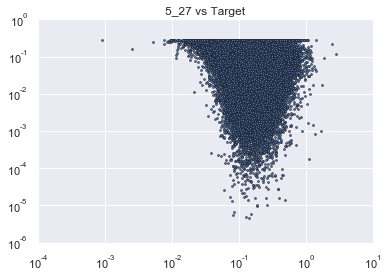

------------------


In [252]:
c = 1
for d in [ca4, cd4, cd3, cd2, cd1]:
    for i in range(0, d.shape[1]):
        tmp = pd.DataFrame({'cd_'+str(i): d.iloc[:,i], 'TARGET': output["TARGET"] })
        ax = plt.subplot()
        ax.set_xscale("log", nonposx='clip')
        ax.set_yscale("log", nonposy='clip')
        plt.plot( 'TARGET', 'cd_'+str(i), data=tmp, linestyle='', marker='o', markersize=2)
        #ax.set_ylim(ymin=0.1)
        ax.set_title(str(c)+'_' + str(i)+ ' vs Target')
        plt.show()
    c+=1
    print('------------------')

In [270]:
#output["TARGET"]

-------------
0.13416782145199999
row  0


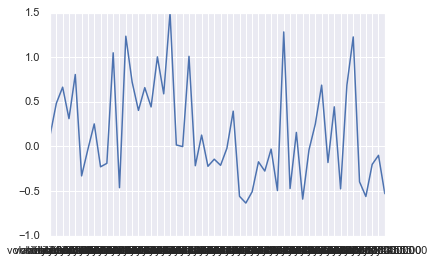

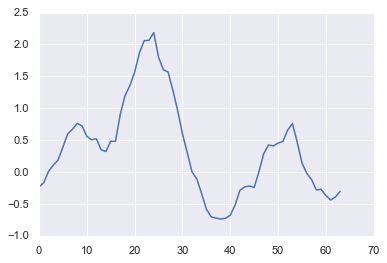

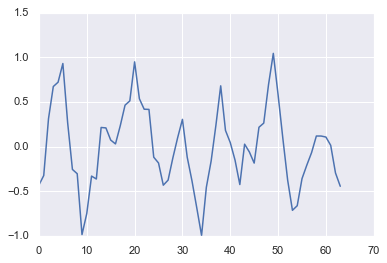

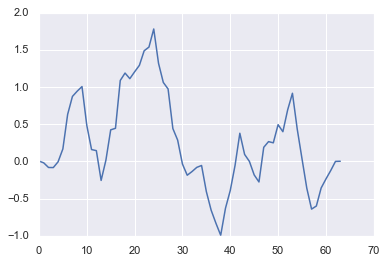

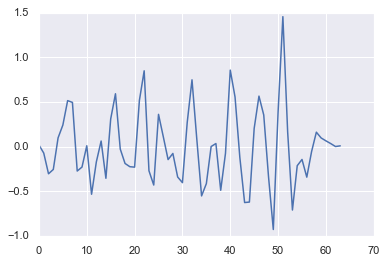

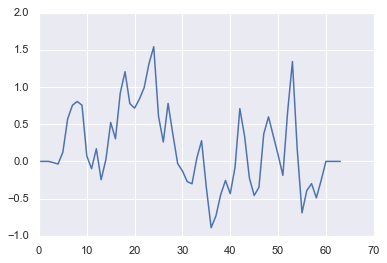

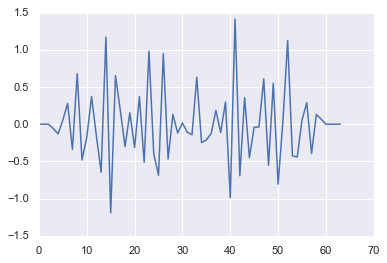

-------------
0.046126179299599994
row  1


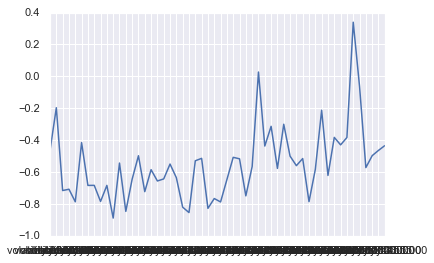

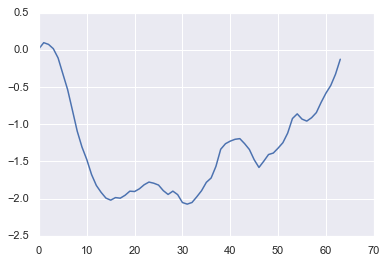

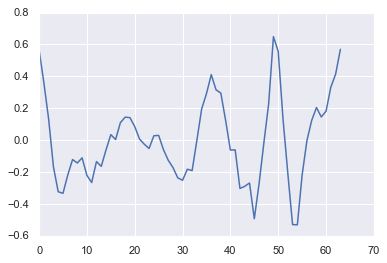

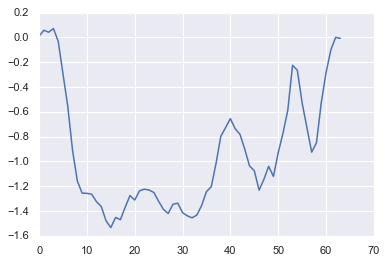

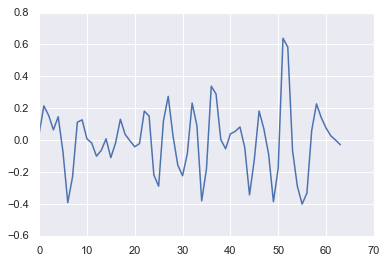

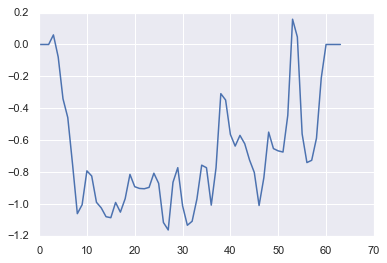

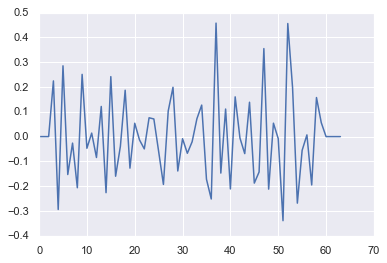

-------------
0.144312438235
row  2


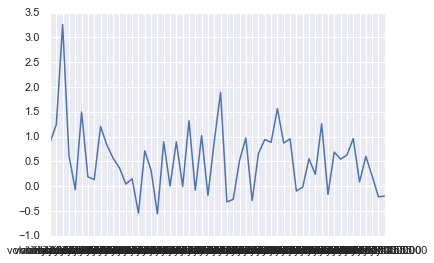

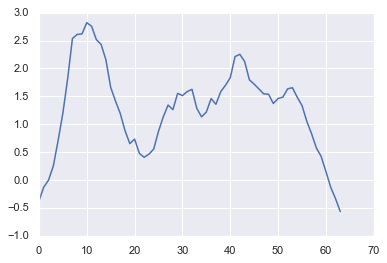

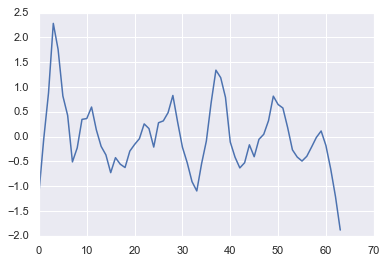

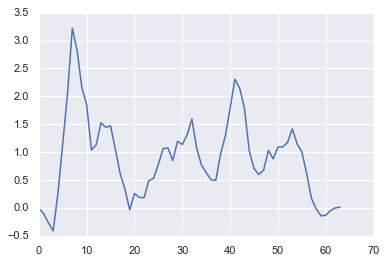

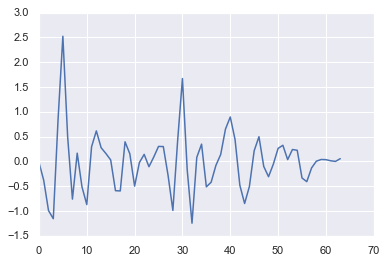

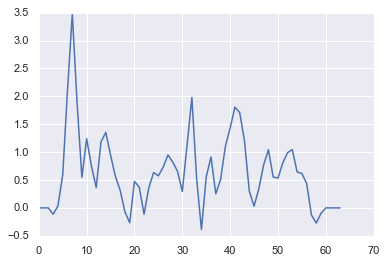

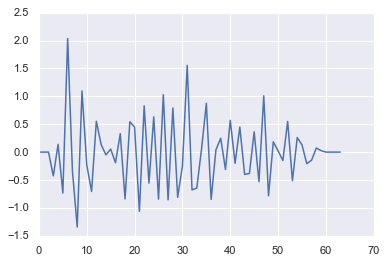

-------------
0.130175677785
row  3


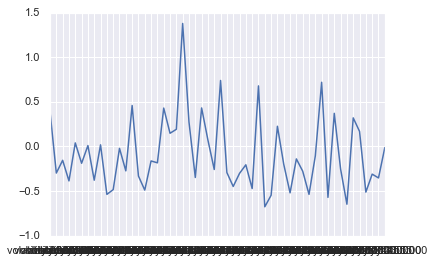

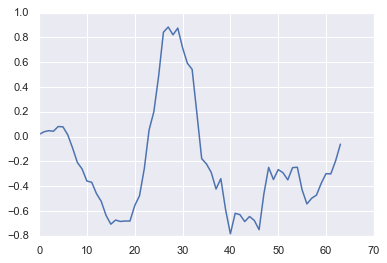

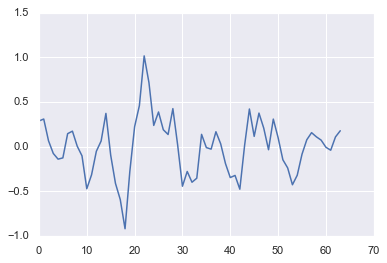

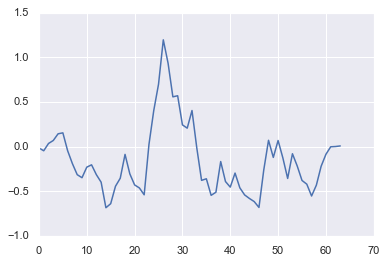

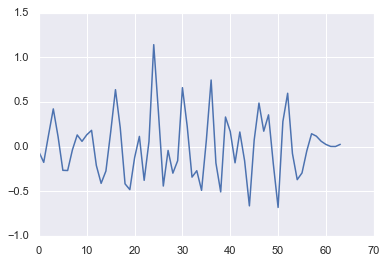

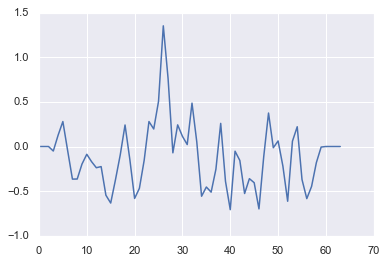

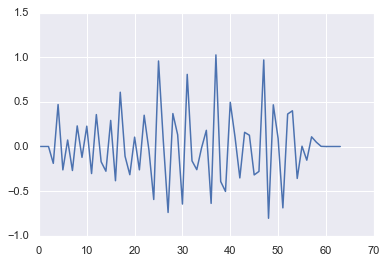

-------------
0.0858725674442
row  4


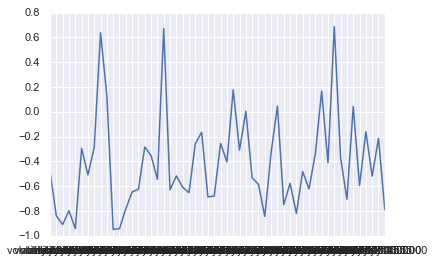

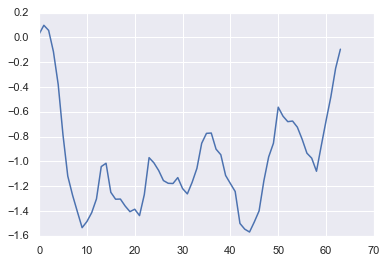

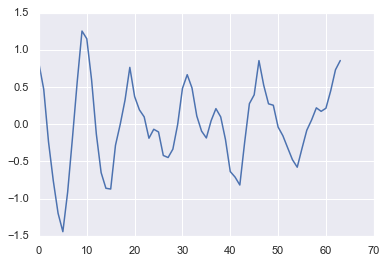

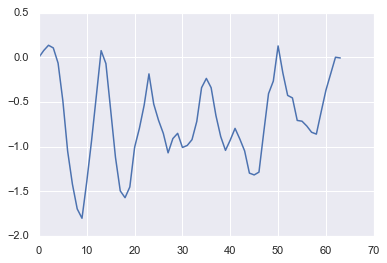

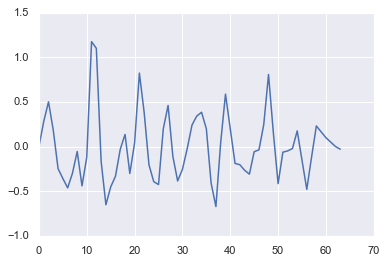

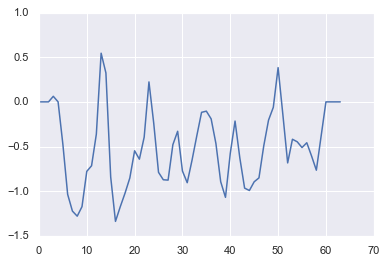

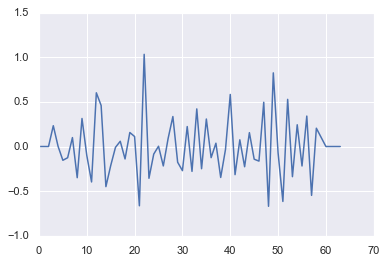

-------------
0.12272394162599999
row  5


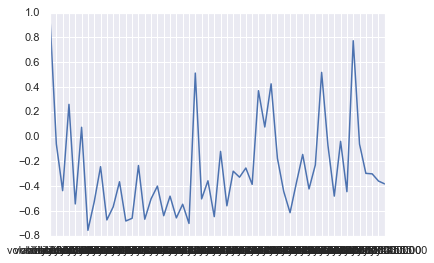

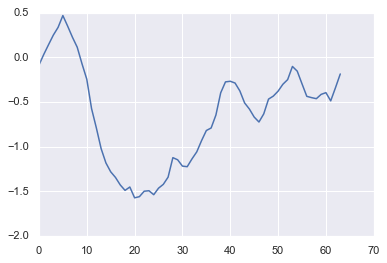

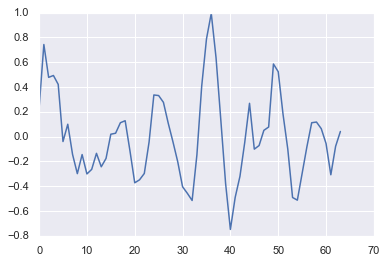

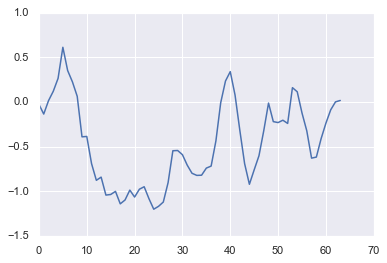

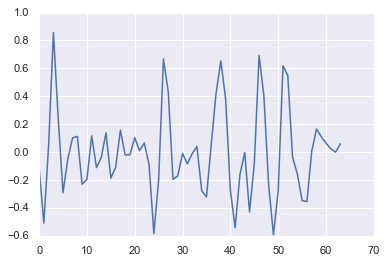

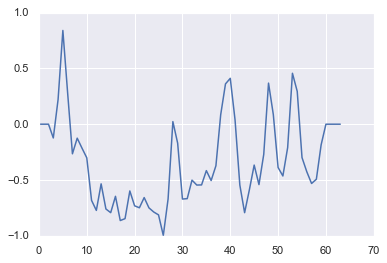

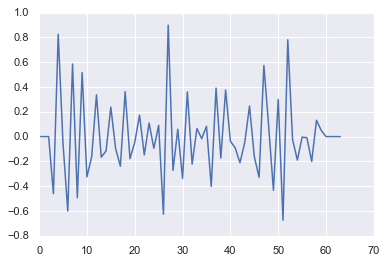

-------------
0.150884664359
row  6


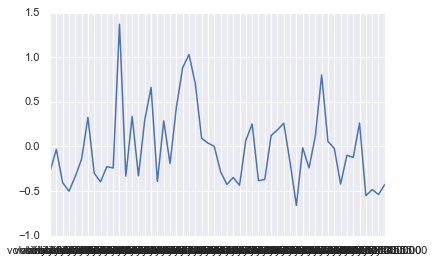

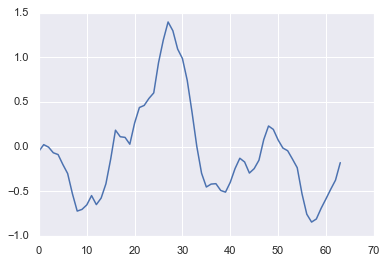

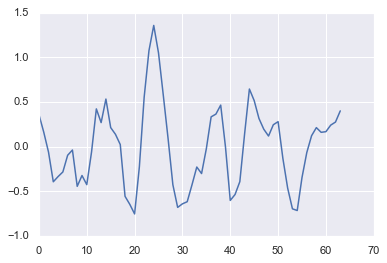

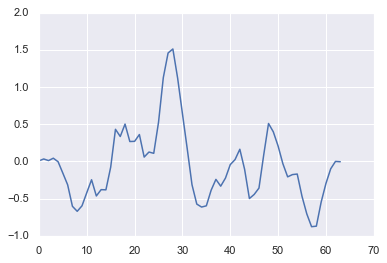

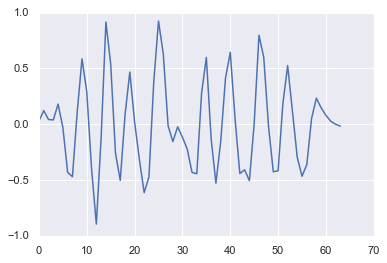

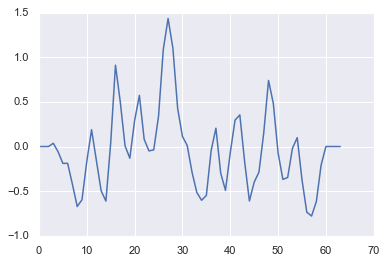

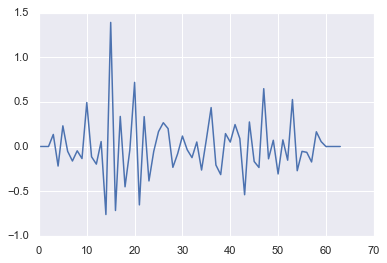

-------------
0.150702603849
row  7


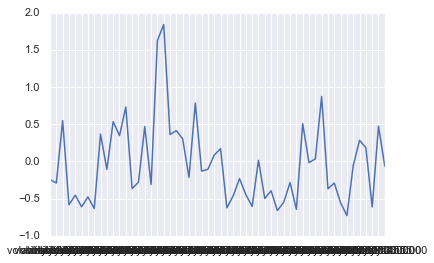

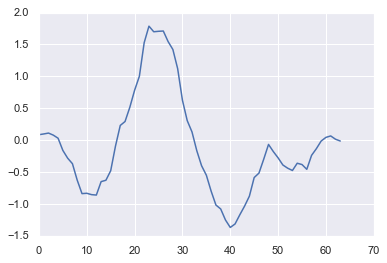

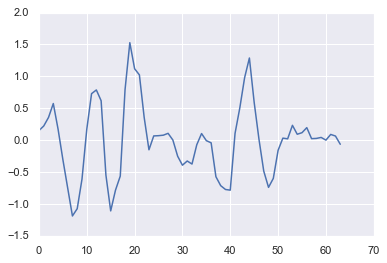

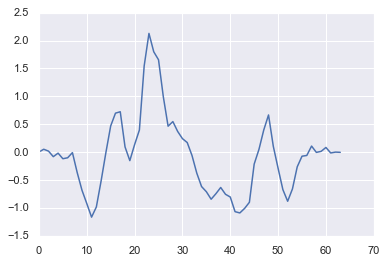

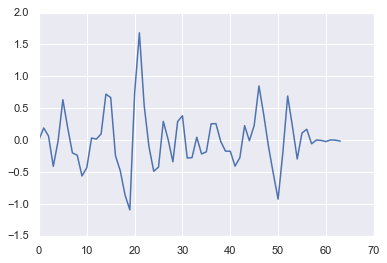

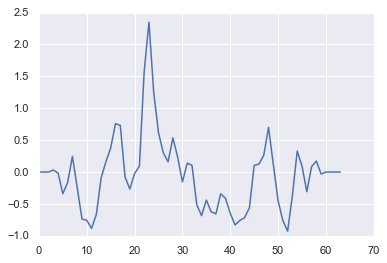

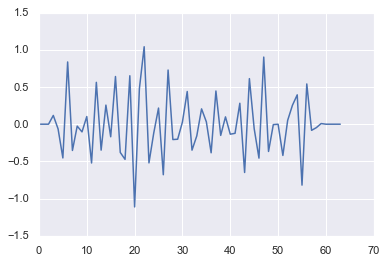

-------------
0.102048394756
row  8


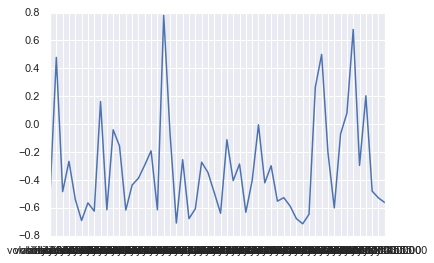

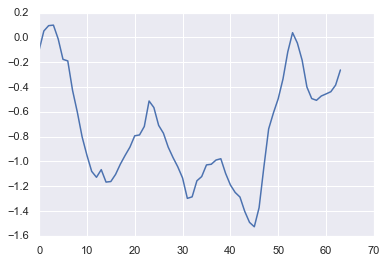

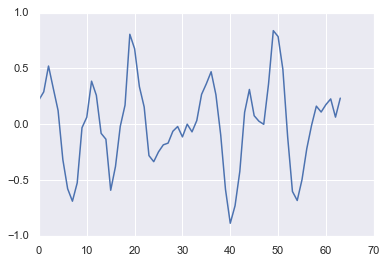

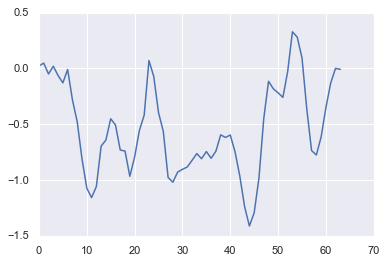

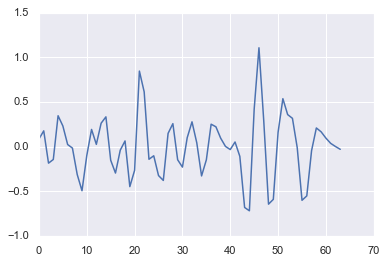

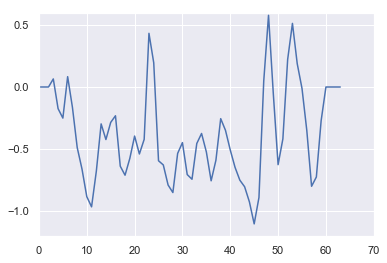

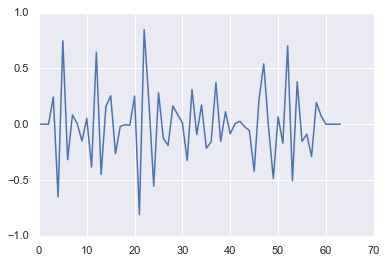

-------------
0.163724440238
row  9


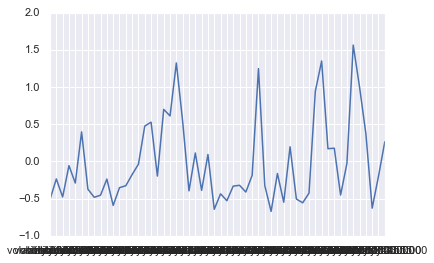

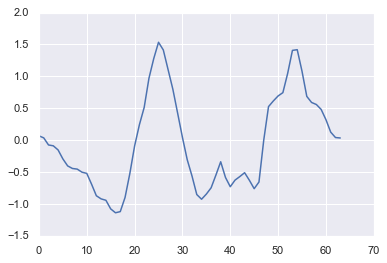

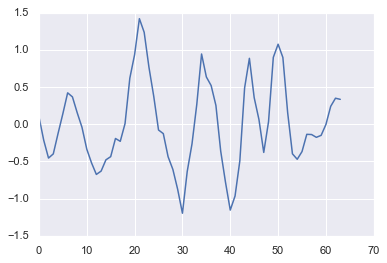

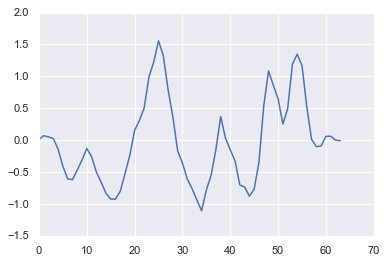

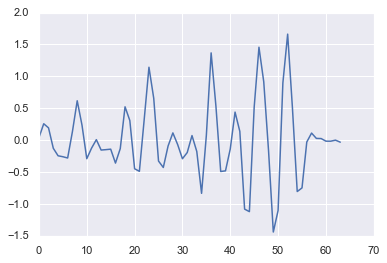

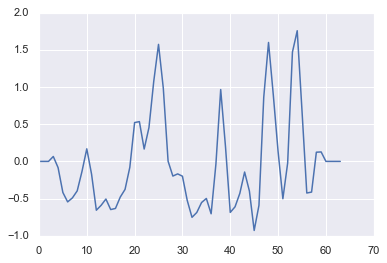

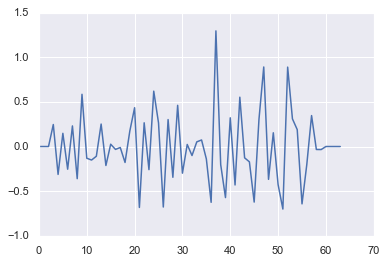

-------------
0.103149124985
row  10


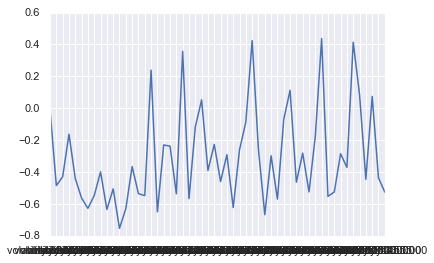

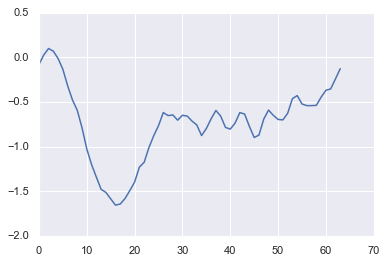

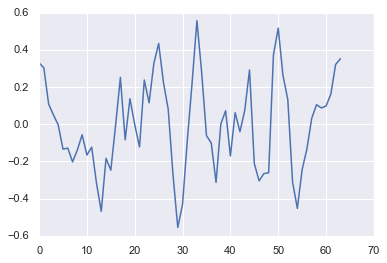

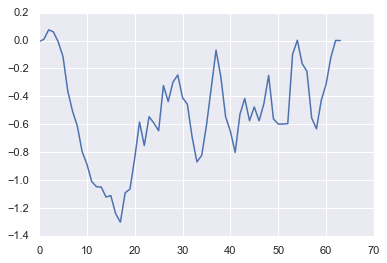

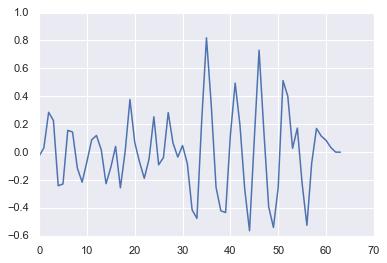

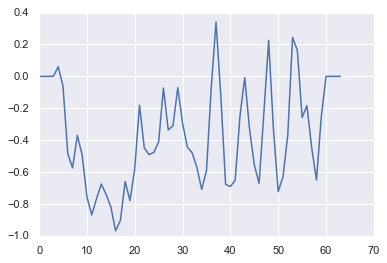

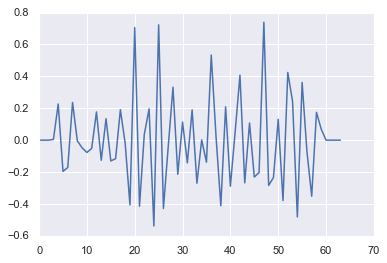

-------------
0.09938586756480002
row  11


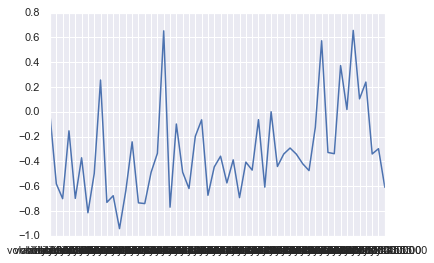

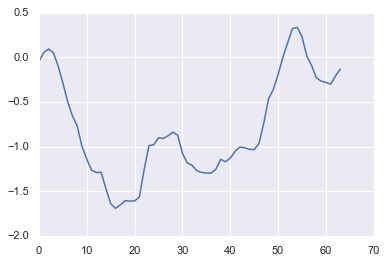

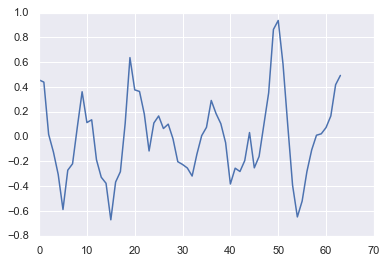

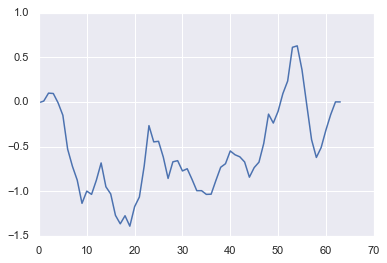

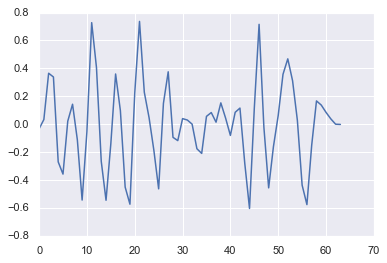

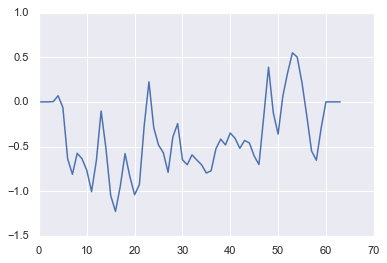

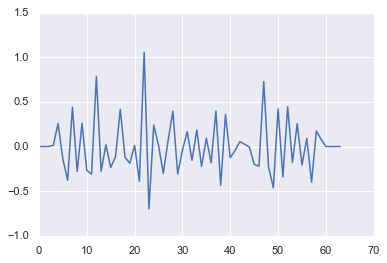

-------------
0.181026873017
row  12


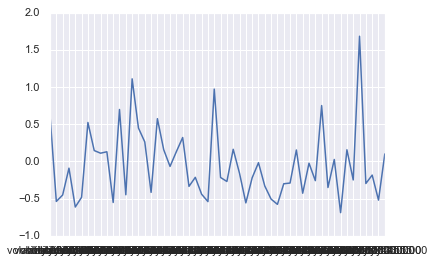

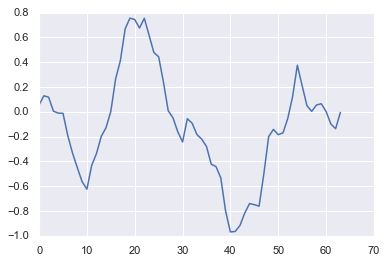

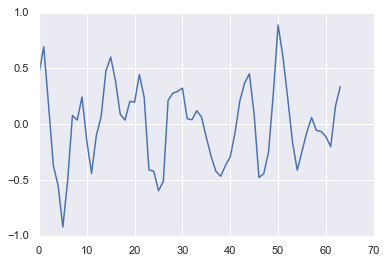

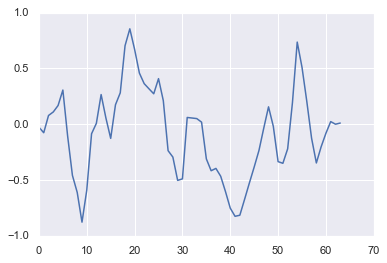

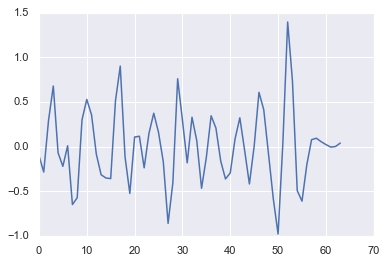

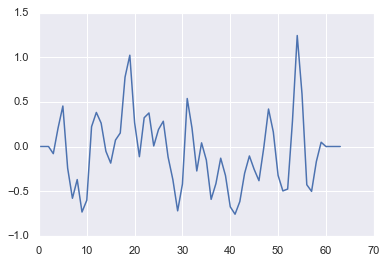

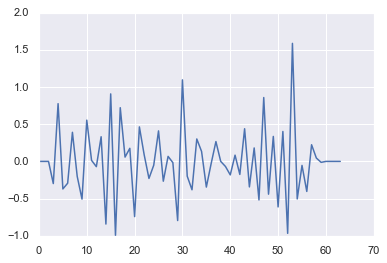

-------------
0.178092440975
row  13


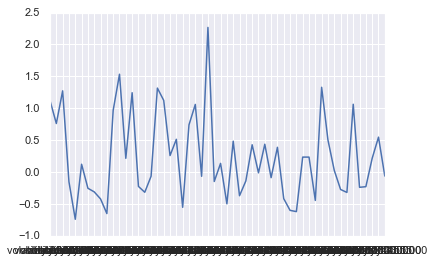

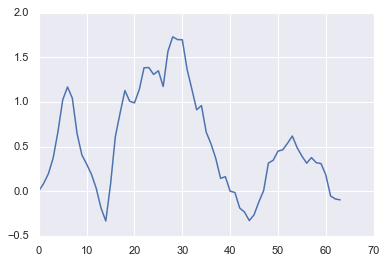

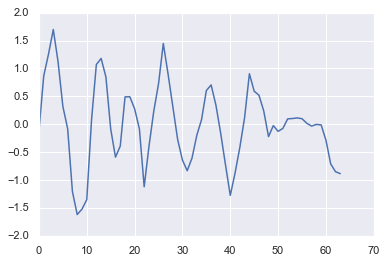

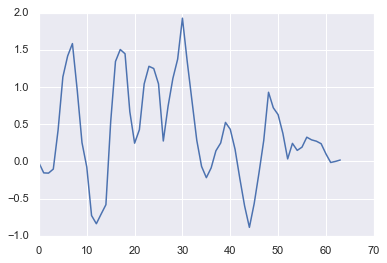

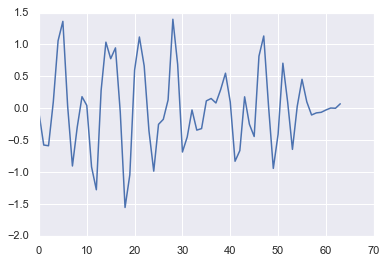

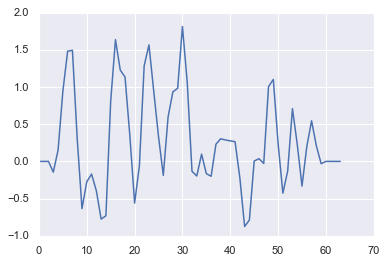

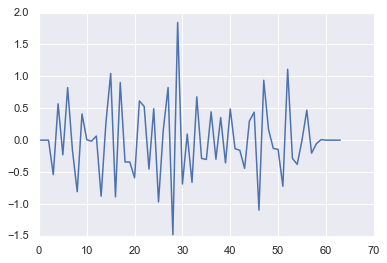

-------------
0.10190031255000001
row  14


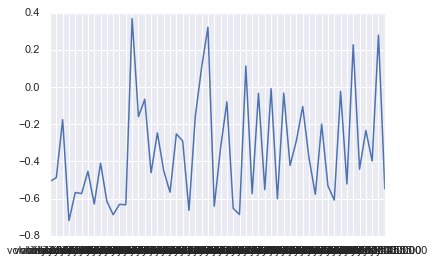

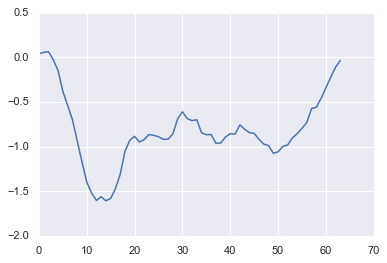

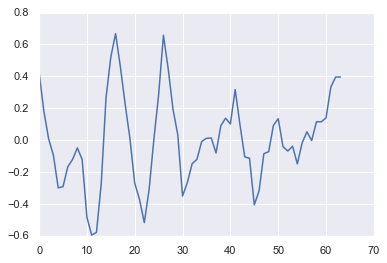

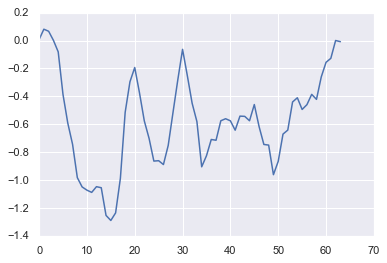

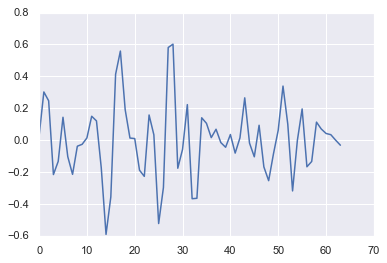

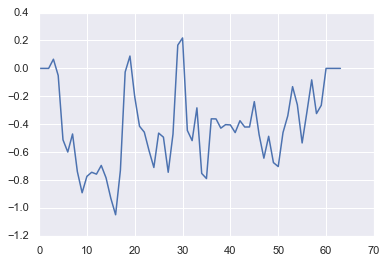

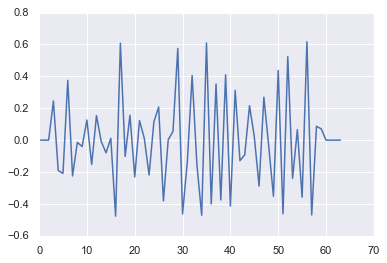

-------------
0.163288659851
row  15


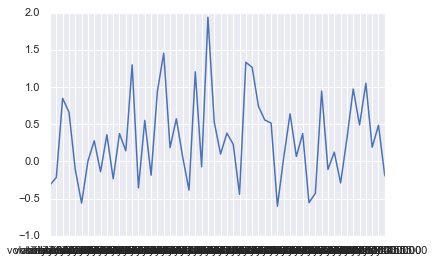

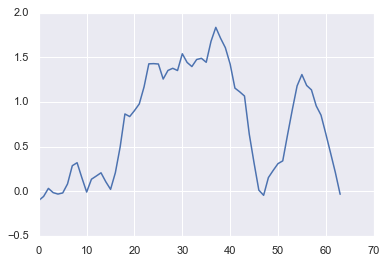

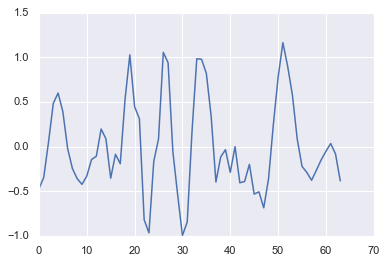

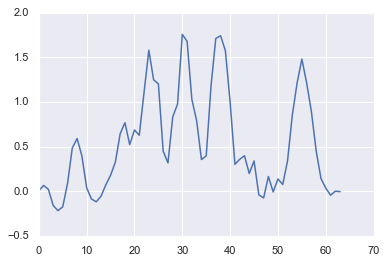

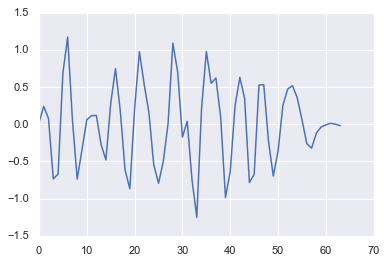

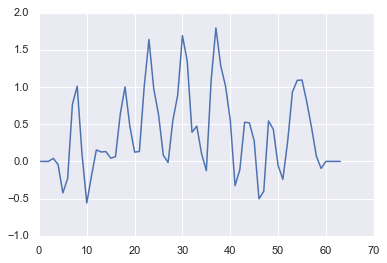

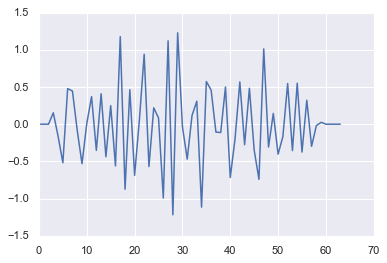

-------------
0.10637719836000001
row  16


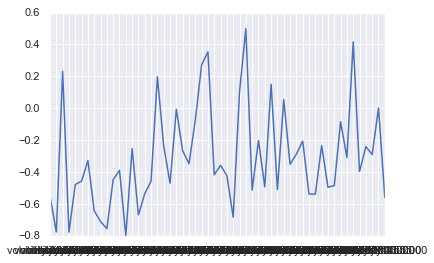

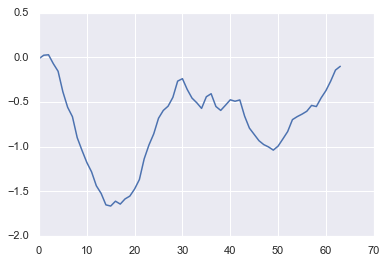

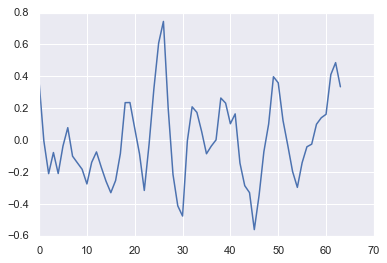

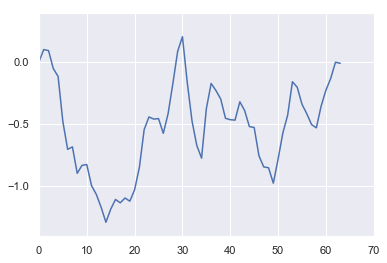

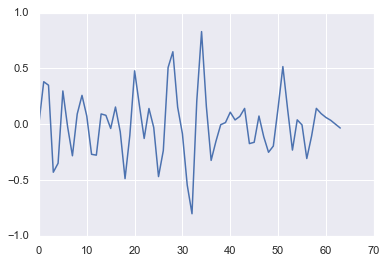

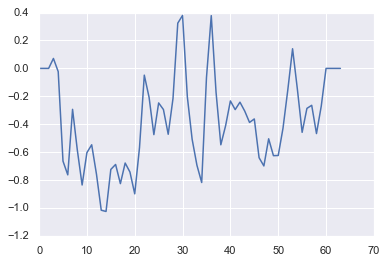

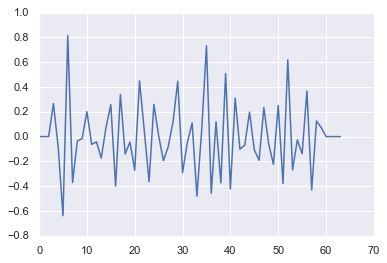

-------------
0.09569924619560001
row  17


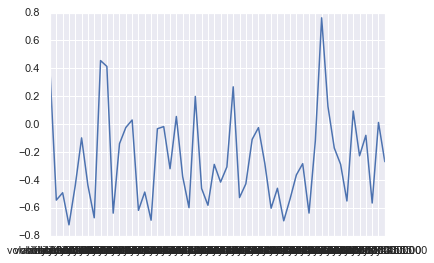

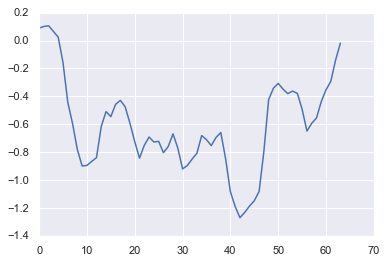

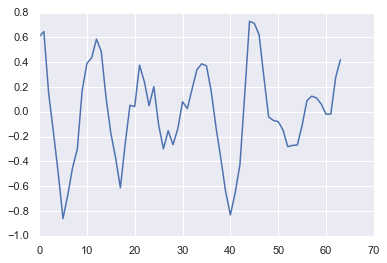

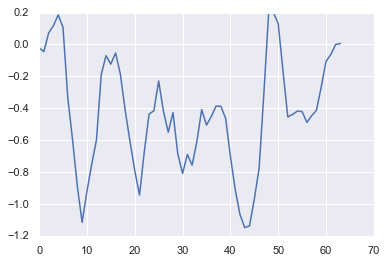

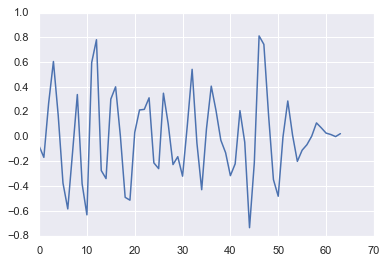

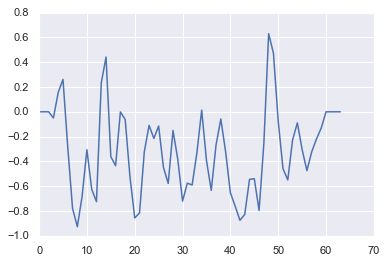

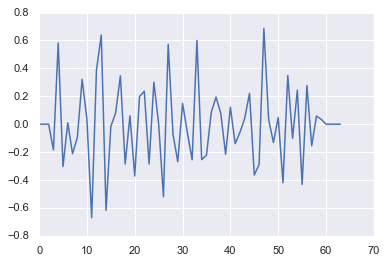

-------------
0.108759003586
row  18


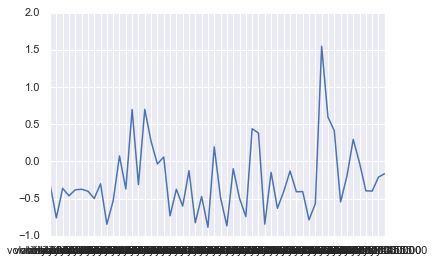

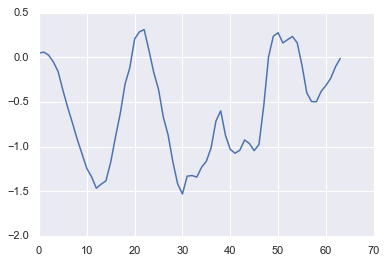

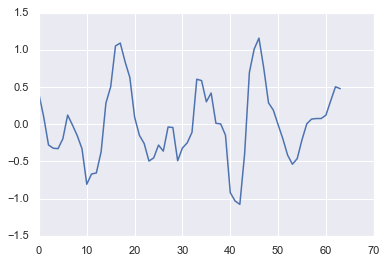

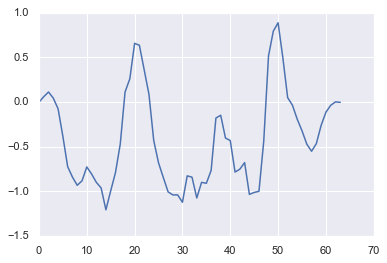

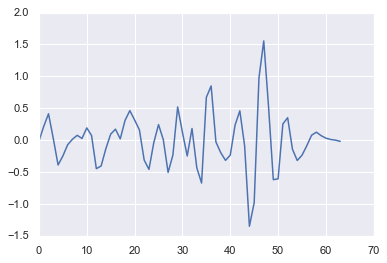

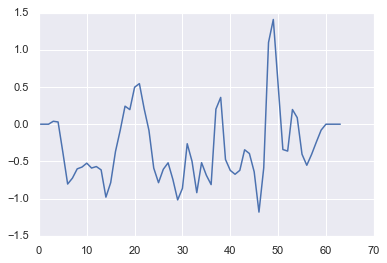

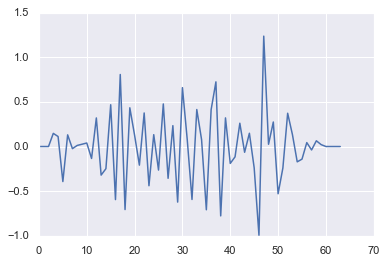

-------------
0.13403271216499998
row  19


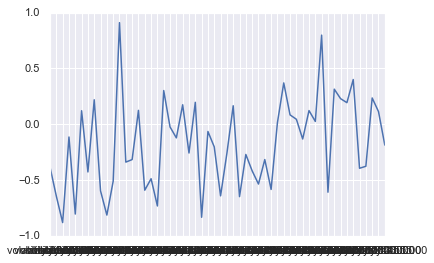

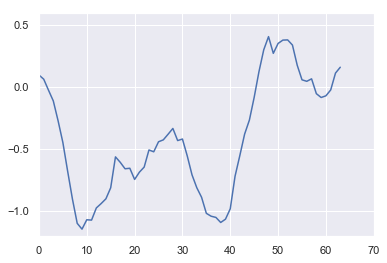

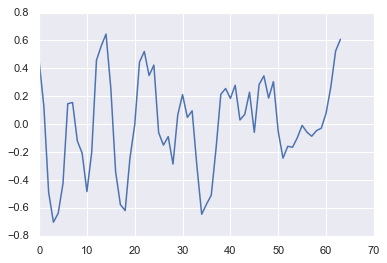

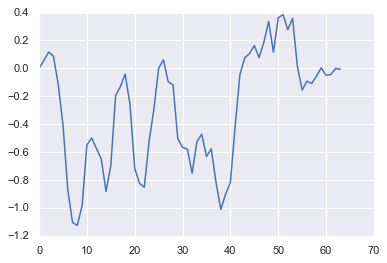

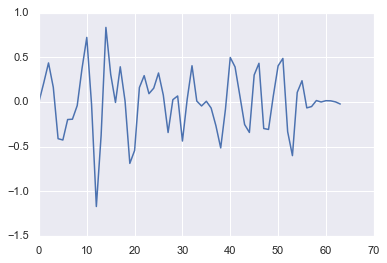

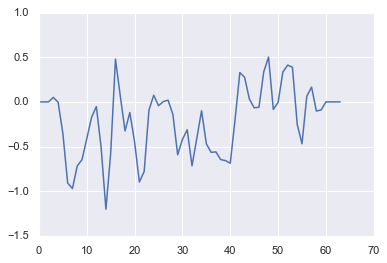

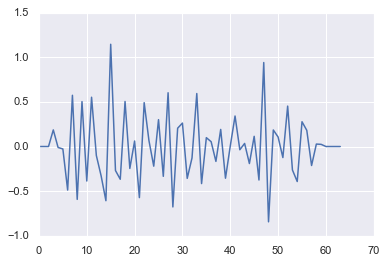

In [273]:
for i in range(20):
    print('-------------')
    print(y[i])
    print("row ", i)
    plt.plot(scaledVol.iloc[i, :])
    plt.show()

    t = pywt.swt(scaleVolPad.iloc[i, :], wavelet='db2', level=3, start_level=0, axis=-1)
    plt.plot(t[0][0])
    plt.show()

    plt.plot(t[0][1])
    plt.show()

    plt.plot(t[1][0])
    plt.show()

    plt.plot(t[1][1])
    plt.show()

    plt.plot(t[2][0])
    plt.show()

    plt.plot(t[2][1])
    plt.show()

In [69]:
#pywt.coeffs_to_array(t, padding=0)
print(len(t))
print(len(t[0]))
print(len(t[0][0]))
print(len(t[0][1]))

print(len(t[1][0]))
print(len(t[1][1]))

print(len(t[2][0]))
print(len(t[2][1]))

t

3
2
64
64
64
64
64
64


[(array([-0.23394173, -0.16853196,  0.01034864,  0.10668649,  0.19044617,
          0.38939053,  0.59571318,  0.67117175,  0.76187461,  0.72433079,
          0.56135108,  0.50602525,  0.52087278,  0.34856598,  0.32207327,
          0.48203451,  0.48149805,  0.90515649,  1.19722241,  1.35352845,
          1.56369079,  1.86414634,  2.05987525,  2.06468816,  2.1868675 ,
          1.80150314,  1.60539121,  1.56725952,  1.2829962 ,  0.96590677,
          0.59947395,  0.30521349,  0.00263779, -0.10803569, -0.33451676,
         -0.58238043, -0.70174277, -0.72223565, -0.73663658, -0.72603541,
         -0.67783752, -0.51963606, -0.28883616, -0.23486166, -0.21867055,
         -0.24078764,  0.00591512,  0.28862185,  0.42422346,  0.40933617,
          0.4546661 ,  0.4796611 ,  0.65750301,  0.75884937,  0.46815497,
          0.14186394, -0.02046653, -0.11926726, -0.2807709 , -0.2710631 ,
         -0.37023999, -0.43898007, -0.38971353, -0.30270266]),
  array([-0.43091197, -0.32510211,  0.31248634,  

## Return 

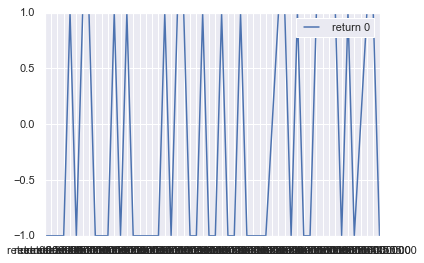

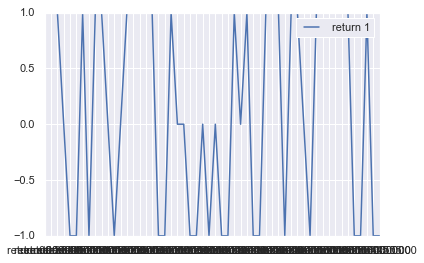

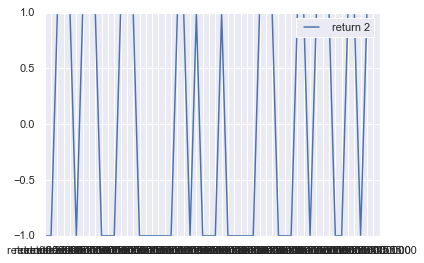

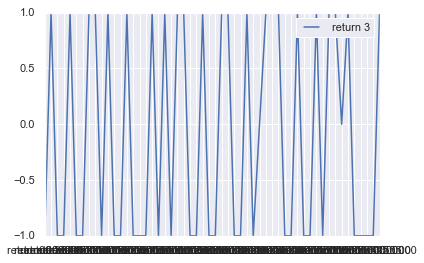

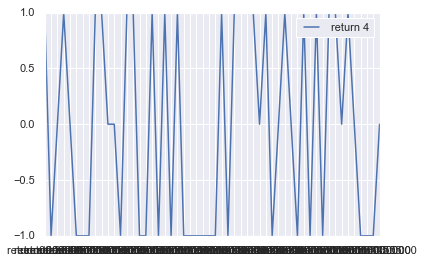

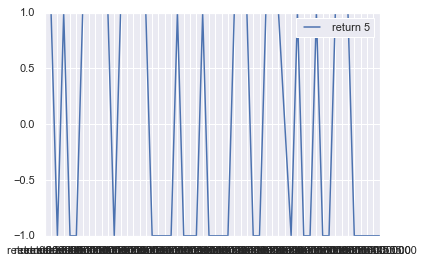

In [29]:
for i in range(0, 6):
    plt.plot(return_.iloc[i, :], label = "return " + str(i))
    plt.legend(loc='upper right')
    plt.show()

In [30]:
def get_return_inflexions(s, viz=False): #s is a serie
    #an inflexion point is when
    #return = 1 after a series of -1 or 0
    #return = -1 after a series of 1 or 0
    inflexlist = []
    tendance =0
    for i in range(0, len(s)):
        if (np.isnan(s[i]) or s[i] ==0): #0 does not change tendance
            continue
        if (tendance != s[i]):
            inflexlist.append(i)
            tendance = s[i]
    
    
    ybeat = [s[x] for x in inflexlist] #Get the y-value of all peaks for plotting purposes
    if (viz):
        fig = plt.figure(figsize=(14, 8))
        ax1 = fig.add_subplot(211)
        ax1.set_title("Detected peaks in signal")
        #ax1.set_xlim(0,1500)
        ax1.plot(s, alpha=0.5, color='blue') #Plot semi-transparent HR
        
        ax1.scatter(inflexlist, ybeat, color='red') #Plot detected peaks
        fig.show()
    return inflexlist

C:\Anaconda3\lib\site-packages\matplotlib\figure.py:459: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


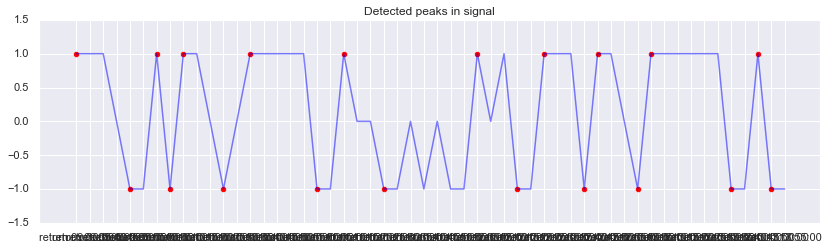

In [33]:
infl = get_return_inflexions(return_.loc[1, :], viz=True)

In [39]:
train[train.product_id==211].head()

,ID,date,product_id,volatility 09:30:00,volatility 09:35:00,volatility 09:40:00,volatility 09:45:00,volatility 09:50:00,volatility 09:55:00,volatility 10:00:00,...,return 13:10:00,return 13:15:00,return 13:20:00,return 13:25:00,return 13:30:00,return 13:35:00,return 13:40:00,return 13:45:00,return 13:50:00,return 13:55:00
210,211,1,211,0.00000,NaN,NaN,0.002999,NaN,NaN,NaN,...,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
528,529,2,211,0.00000,0.001358,NaN,0.000000,0.000000,0.728075,0.623257,...,NaN,NaN,NaN,NaN,NaN,0.0,NaN,NaN,1.0,-1.0
846,847,3,211,NaN,NaN,2.633421,NaN,0.980574,0.695336,1.203914,...,-1.0,0.0,-1.0,NaN,0.0,-1.0,1.0,NaN,1.0,NaN
1412,1413,5,211,1.44586,0.003672,0.179451,0.378615,0.338156,0.000000,0.000000,...,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,0.0,NaN
1730,1731,6,211,NaN,NaN,0.259954,0.000000,NaN,0.000000,NaN,...,NaN,1.0,NaN,NaN,NaN,NaN,0.0,NaN,NaN,-1.0


In [43]:
return_.iloc[210:211, :].head()

,return 09:30:00,return 09:35:00,return 09:40:00,return 09:45:00,return 09:50:00,return 09:55:00,return 10:00:00,return 10:05:00,return 10:10:00,return 10:15:00,...,return 13:10:00,return 13:15:00,return 13:20:00,return 13:25:00,return 13:30:00,return 13:35:00,return 13:40:00,return 13:45:00,return 13:50:00,return 13:55:00
210,0.0,NaN,NaN,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,0.0,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN


C:\Anaconda3\lib\site-packages\matplotlib\figure.py:459: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


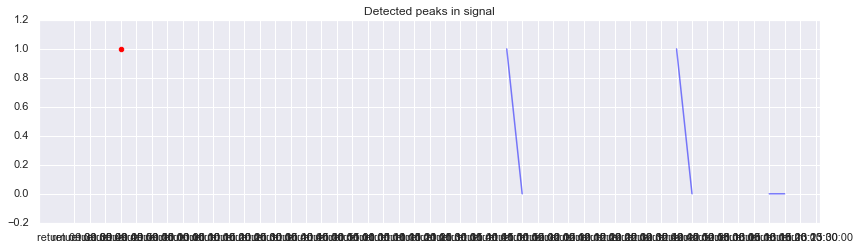

In [54]:


infl211 = get_return_inflexions(return_.iloc[210, :], viz=True)

1.6666666666666667
0.08333333333333333


for features we can compute the equivalent of 
Heart Rate Variability” (HRV) measures:
- IBI (inter-beat interval), the mean distance of intervals between heartbeat
- SDNN, the standard deviation of intervals between heartbeats (usually computed on the average of 5 minutes on 24 hours)
- SDSD, the standard deviation of successive differences between adjacent R-R intervals
- RMSSD, the root mean square of successive differences between adjacent R-R intervals:
- pNN50, the number of pairs of successive differences  that differ by more than 50 ms / total number of pairs. As the sampling rate is 50hz, 20 ms differences is on "tick" and we can have pNN60 but not pNN50
- median absolute deviation of RR intervals (MAD)

In [56]:
# inflexion per hours - 12 sample per hours
print(len(infl)/12)
print(len(infl211)/12)

1.6666666666666667
0.08333333333333333


In [71]:
F = []
for i in range(0, return_.shape[0]):
    F.append(len(get_return_inflexions(return_.iloc[i, :]))/12)

In [278]:
np.std(F)

NameError: name 'F' is not defined

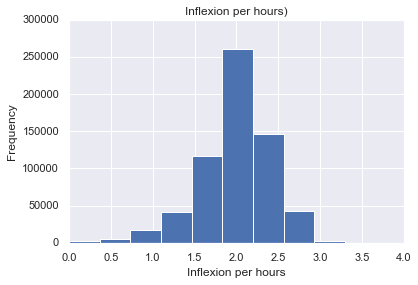

In [79]:
plt.hist(F)
plt.title("Inflexion per hours)")
plt.xlabel("Inflexion per hours")
plt.ylabel("Frequency")
#plt.yscale('log', nonposy='clip')
plt.show()

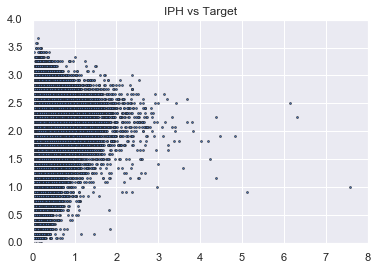

In [85]:
tmp = pd.DataFrame({'IPH': F, 'TARGET': output["TARGET"] })
ax = plt.subplot()
#ax.set_xscale("log", nonposx='clip')
#ax.set_yscale("log", nonposy='clip')
plt.plot( 'TARGET', 'IPH', data=tmp, linestyle='', marker='o', markersize=2)
#ax.set_ylim(ymin=0.1)
ax.set_title('IPH vs Target')
plt.show()

In [73]:
def SDNN(peak):
    RR = []
    L= peak
    for i in range(1, len(L)):
        RR.append(L[i]-L[i-1])
    return pd.Series(RR).std()/12

def SDSD(peak):
    
    RR = []
    RRdif = []
    L= peak
    for i in range(1, len(L)):
        RR.append(L[i]-L[i-1])
    for j in range(1, len(RR)):
        RRdif.append(RR[j]-RR[j-1])
    return pd.Series(RRdif).std()/12


def RMSSD(peak):
    i=1
    RR = []
    RRdif = []
    L= peak
    for i in range(1, len(L)):
        RR.append(L[i]-L[i-1])
    for j in range(1, len(RR)):
        RRdif.append(RR[j]-RR[j-1])
    r = pd.Series(RRdif)**2
    
    return np.sqrt(r.mean())/12


#pNN(k), the number of pairs of successive differences that differ by more than k*5 minutes/ total number of pairs
# as the sampling rate is 50hz, 20 ms differences is on "tick" and we can have pNN60 but not p50
def pNN(peak, k):
    #k is the number of tick pNN20 = pNN(s, 1), pNN60(s, 3)
    i=1
    RR = []
    RRdif = []
    L= peak
    for i in range(1, len(L)):
        RR.append(L[i]-L[i-1])
    l = len(RR)
    count = 0
    for j in range(1, len(RR)):
        if (RR[j]-RR[j-1]) > k:
            count = count +1
    if (l==0):
        result = 0
    else:
        result = count/l
    return result

#median absolute deviation of RR intervals (MAD)

def MAD(peak):
    i=1
    RR = []
    L= peak
    for i in range(1, len(L)):
        RR.append(L[i]-L[i-1])
        
    r = pd.Series(RR)
    return robust.mad(r, c=1)

In [74]:
SDNN_ = []
SDSD_ = []
RMSSD_ = []
MAD_ = []
for i in range(0, return_.shape[0]):
    p = get_return_inflexions(return_.iloc[i, :])
    SDNN_.append(SDNN(p))
    SDSD_.append(SDSD(p))
    RMSSD_.append(RMSSD(p))
    MAD_.append(MAD(p))
    
    




C:\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:2920: RuntimeWarning: Mean of empty slice.
  out=out, **kwargs)
C:\Anaconda3\lib\site-packages\numpy\core\_methods.py:85: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


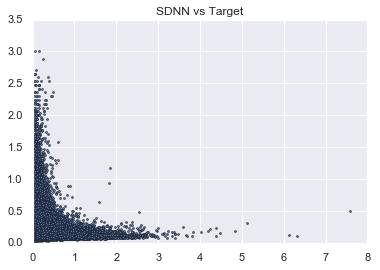

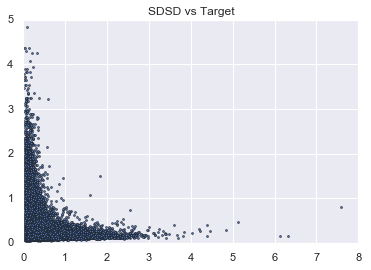

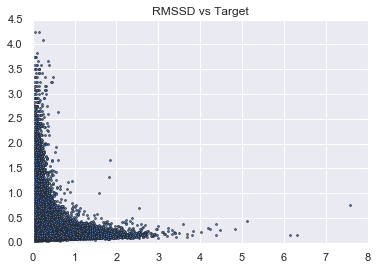

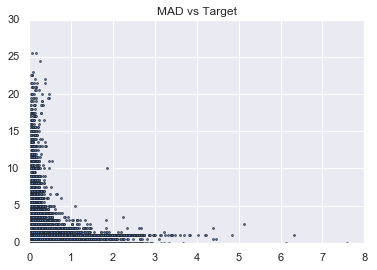

In [89]:
tmp = pd.DataFrame({'SDNN': SDNN_, 'TARGET': output["TARGET"] })
ax = plt.subplot()
#ax.set_xscale("log", nonposx='clip')
#ax.set_yscale("log", nonposy='clip')
plt.plot( 'TARGET', 'SDNN', data=tmp, linestyle='', marker='o', markersize=2)
#ax.set_ylim(ymin=0.1)
ax.set_title('SDNN vs Target')
plt.show()

tmp = pd.DataFrame({'SDSD': SDSD_, 'TARGET': output["TARGET"] })
ax = plt.subplot()
#ax.set_xscale("log", nonposx='clip')
#ax.set_yscale("log", nonposy='clip')
plt.plot( 'TARGET', 'SDSD', data=tmp, linestyle='', marker='o', markersize=2)
#ax.set_ylim(ymin=0.1)
ax.set_title('SDSD vs Target')
plt.show()

tmp = pd.DataFrame({'RMSSD': RMSSD_, 'TARGET': output["TARGET"] })
ax = plt.subplot()
#ax.set_xscale("log", nonposx='clip')
#ax.set_yscale("log", nonposy='clip')
plt.plot( 'TARGET', 'RMSSD', data=tmp, linestyle='', marker='o', markersize=2)
#ax.set_ylim(ymin=0.1)
ax.set_title('RMSSD vs Target')
plt.show()

tmp = pd.DataFrame({'MAD': MAD_, 'TARGET': output["TARGET"] })
ax = plt.subplot()
#ax.set_xscale("log", nonposx='clip')
#ax.set_yscale("log", nonposy='clip')
plt.plot( 'TARGET', 'MAD', data=tmp, linestyle='', marker='o', markersize=2)
#ax.set_ylim(ymin=0.1)
ax.set_title('MAD vs Target')
plt.show()

In [ ]:
plt.hist(SDNN_)
plt.title("SDNN")
#plt.xlabel("")
#plt.ylabel("Frequency")
#plt.yscale('log', nonposy='clip')
plt.show()

plt.hist(SDSD_)
plt.title("SDSD")
plt.xlabel("")
plt.ylabel("Frequency")
#plt.yscale('log', nonposy='clip')
plt.show()

plt.hist(RMSSD_)
plt.title("RMSSD")
plt.xlabel("")
plt.ylabel("Frequency")
#plt.yscale('log', nonposy='clip')
plt.show()

plt.hist(MAD_)
plt.title("MAD")
plt.xlabel("")
plt.ylabel("Frequency")
#plt.yscale('log', nonposy='clip')
plt.show()

In [ ]:
y.head()

In [ ]:
volatility.describe()

In [ ]:
plt.plot(range(0, volatility.shape[1]), volatility.mean(), label = "volatility mean")
plt.legend(loc='upper right')
plt.show()

plt.plot(range(0, volatility.shape[1]), volatility.max(), label = "volatility max")
plt.legend(loc='upper right')
plt.show()

plt.plot(range(0, volatility.shape[1]), volatility.quantile(q=0.75), label = "volatility 75%")
plt.legend(loc='upper right')
plt.show()

plt.plot(range(0, volatility.shape[1]), volatility.quantile(q=0.95), label = "volatility 95%")
plt.legend(loc='upper right')
plt.show()

plt.plot(range(0, volatility.shape[1]), volatility.std(), label = "volatility std")
plt.legend(loc='upper right')
plt.show()

In [ ]:
y.describe()

In [ ]:
volatility.mean().shape

## Chasse au NaN

In [57]:
def count_NA(s):
    result = 0
    if s.isna().any():
        result = s.value_counts(dropna=False).loc[np.nan]
        
    return result


In [58]:
volatility.iloc[3930, :].value_counts(dropna=False).sort_index(na_position='first').iloc[0]

42

In [59]:
count_NA(volatility.iloc[3930, :])

42

In [60]:
count_NA(volatility.iloc[3931, :])

0

In [61]:
count_NA(volatility.iloc[:, 0])

28091

In [62]:
volatility.iloc[:, 0].value_counts(dropna=False).loc[np.nan]

28091

In [63]:
volatility.iloc[:, 0].value_counts(dropna=False).sort_index(na_position='first').iloc[0]

28091

In [64]:
volatility.shape

(636313, 54)

%na in  volatility 09:30:00 :  4.414651280109003


Text(0,0.5,'Frequency')

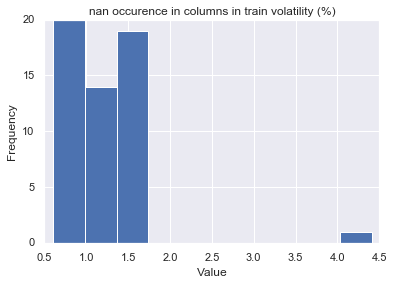

In [65]:
l=[]
for i in volatility.columns:
    v = count_NA(volatility.loc[:, i])*100/volatility.shape[0]
    l.append(v)
    if (v>2):
        print("%na in ", i, ": ", v)
plt.hist(l)
plt.title("nan occurence in columns in train volatility (%)")
plt.xlabel("Value")
plt.ylabel("Frequency")    
    

%na in  volatility 09:30:00 :  4.612667036505619


Text(0,0.5,'Frequency')

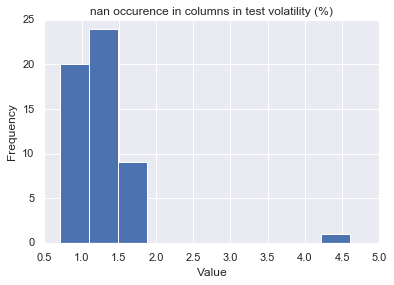

In [66]:
l=[]
for i in volatility.columns:
    v = count_NA(volatilityTest.loc[:, i])*100/volatility.shape[0]
    l.append(v)
    if (v>2):
        print("%na in ", i, ": ", v)
plt.hist(l)
plt.title("nan occurence in columns in test volatility (%)")
plt.xlabel("Value")
plt.ylabel("Frequency")     

In [ ]:
l=[]
for i in volatility.index:
    v = count_NA(volatility.iloc[i, :])*100/volatility.shape[1]
    l.append(v)
#    if (v>2):
#        print("%na in ", i, ": ", v)
plt.hist(l)
plt.title("nan occurence in rows in train volatility (%)")
plt.xlabel("Value")
plt.ylabel("Frequency")  


In [ ]:

l=[]
for i in volatility.index:
    v = count_NA(volatility.iloc[i, :])*100/volatility.shape[1]
    l.append(v)
#    if (v>2):
#        print("%na in ", i, ": ", v)
plt.hist(l)
plt.title("nan occurence in rows in train volatility (%)")
plt.xlabel("% of NaN")
plt.ylabel(" log Frequency")
plt.yscale('log', nonposy='clip')

In [ ]:
l=[]
for i in volatilityTest.index:
    v = count_NA(volatilityTest.iloc[i, :])*100/volatilityTest.shape[1]
    l.append(v)
#    if (v>2):
#        print("%na in ", i, ": ", v)
plt.hist(l)
plt.title("nan occurence in rows in test volatility (%)")
plt.xlabel("% of NaN")
plt.ylabel("Frequency")
plt.yscale('log', nonposy='clip')

In [ ]:
for i in volatility.columns:
    volatility.loc[:, i].value_counts(dropna=False).sort_index(na_position='first').iloc[0]

In [ ]:
for i in range(0, volatility.shape[1]):
    print(volatility.iloc[:, i].isna().value_counts())

In [ ]:
#volatility.columns = list(range(0, 54))


In [ ]:
vol_nona = volatility.interpolate(axis=1)

In [ ]:
vol_nona = volatility.interpolate(axis=1, method='nearest')

In [ ]:
for i in range(0, vol_nona.shape[1]):
    print(vol_nona.iloc[:, i].isna().value_counts()[1:2])

In [ ]:
vol_nona.iloc[:, i].isnull().value_counts()

In [ ]:
vol_nona.iloc[:, i].isnull().value_counts()[1:2]

In [ ]:
volatility.shape[1]

In [ ]:
volatility.columns = list(range(0, 54))


In [ ]:
volatility.head()